<h1 style="background-color:#4E9A06; color:#ffffff; padding:10px 15px; border-radius:5px; margin-top:1rem; margin-bottom:1rem; text-align:center;">
  02a – Exploratory Data Analysis for Hypotheses' Validations
</h1>


<h2 style="color: #4E9A06; margin-top: 1rem; margin-bottom: 0.5rem;">
Objectives
</h2>
<ul>
  <li><strong>Test five core hypotheses</strong> linking climate metrics and plant‐disease incidence across wild vs. agricultural systems.</li>
  <li><strong>Quantify</strong> main effects, system‐type sensitivity, mismatch interactions, pathogen‐type modulation, and transmission‐mode effects.</li>
  <li><strong>Summarize</strong> each validation step with statistical tables and diagnostic plots for easy reference.</li>
</ul>

<h2 style="color: #4E9A06; margin-top: 1rem; margin-bottom: 0.5rem;">
Inputs
</h2>
<ul>
  <li><code>merged_climate_disease_final.csv</code>: cleaned dataset including incidence, climate anomalies, system type, pathogen group, and transmission mode.</li>
  <li>Pre‐computed anomaly columns: <code>abs_temp_anom</code>, <code>abs_precip_anom</code>.</li>
  <li>Metadata columns: <code>system_type</code>, <code>Antagonist_type_general</code>, <code>transmission_mode_group</code>, <code>tolerance_class</code>.</li>
</ul>

<h2 style="color: #4E9A06; margin-top: 1rem; margin-bottom: 0.5rem;">
Outputs
</h2>
<ul>
  <li> <b>Tables</b> of R² and interaction coefficients for Hypotheses 1–5.</li>
  <li> <b>Plots</b> for each hypothesis:
    <ul>
      <li>Linear/quadratic fits (Hypotheses 1–2)</li>
      <li>Mismatch interaction plots (Hypothesis 3)</li>
      <li>Pathogen‐type & tolerance‐class curves (Hypothesis 4)</li>
      <li>Transmission‐mode sensitivity scatter & LOWESS (Hypothesis 5)</li>
    </ul>
  </li>
  <li>**Markdown summaries** with key results and concise conclusions.</li>
</ul>

<h2 style="color: #4E9A06; margin-top: 1rem; margin-bottom: 0.5rem;">
Additional Comments
</h2>
<ul>
  <li>All analyses use <code>statsmodels</code> for OLS regressions and <code>seaborn</code> for consistent styling.</li>
  <li>Each hypothesis section ends with a brief “takeaway” to guide interpretation.</li>
  <li>Notebook is self-contained: rerunning all cells reproduces every table and figure.</li>
  <li>Future: integrate interactive widgets (e.g., to toggle systems or pathogen groups) in 02b dashboard.</li>
</ul>
<hr>

<h2 style="color: #4E9A06; margin-top: 1rem; margin-bottom: 0.5rem;">
  2.0 Environment Setup & Imports
</h2>

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
import sys
import numpy as np
import os

# Add style_loader path manually
STYLE_DIR = Path.cwd() / "notebook_style"
if str(STYLE_DIR) not in sys.path:
    sys.path.insert(0, str(STYLE_DIR))

from style_loader import load_style

load_style()
print("Style loaded successfully")

# Fallback safety
WILD_COLOR = globals().get("WILD_COLOR", "#66c2a5")
AG_COLOR = globals().get("AG_COLOR", "#3288bd")


Injected custom CSS from: c:\Users\baner\OneDrive\Documenti\data_analytics_AI\capstone_CI_main\climacrop_health\climacrop_health\jupyter_notebooks\notebook_style\custom.css
Style loaded successfully


<!-- ──────────────────────────────────────────────────────────────────────── -->
<!-- Cell 2: Section Header (H2) “2.1 Imports & Load Data”                     -->
<!-- ──────────────────────────────────────────────────────────────────────── -->
<h2 style="color:#4E9A06; margin-top:1rem; margin-bottom:0.5rem;">
  2.1 Load Data
</h2>


In [2]:
# Load cleaned dataset from previous step
PROCESSED_DIR = Path("../data/processed")
cleaned_fp = PROCESSED_DIR / "merged_climate_disease_final.csv"

df = pd.read_csv(cleaned_fp)
print("Shape:", df.shape)
df.head()

Shape: (4932, 56)


,study_id,First_author,Study_Year,Person_extracting,Date_extracted,Paper_double_checked,study_reference,Host.species,Host_family,Host_order,...,start_date,monthly_temp,contemp_temp,contemp_precip,.geo,calculated_incidence,duration_mo,temp_anomaly,rain_anomaly,incidence_zone
0,715,Abbate,2014,Vianda,2021-06-30,Devin,Abbate_2014,Silene vulgaris,Caryophyllaceae,Caryophyllales,...,2008-08-01,181.284576,288.956314,0.005280,"{""type"":""Polygon"",""coordinates"":[[[6.028999805...",0.000000,1,107.671738,-78.742580,Low
1,715,Abbate,2014,Vianda,2021-06-30,Devin,Abbate_2014,Silene vulgaris,Caryophyllaceae,Caryophyllales,...,2008-08-01,133.753340,288.499283,0.005288,"{""type"":""Polygon"",""coordinates"":[[[6.117000102...",0.000000,1,154.745943,-96.430852,Low
2,715,Abbate,2014,Vianda,2021-06-30,Devin,Abbate_2014,Silene vulgaris,Caryophyllaceae,Caryophyllales,...,2008-08-01,129.520853,288.499283,0.005288,"{""type"":""Polygon"",""coordinates"":[[[6.122000217...",0.000000,1,158.978430,-98.153206,Low
3,715,Abbate,2014,Vianda,2021-06-30,Devin,Abbate_2014,Silene vulgaris,Caryophyllaceae,Caryophyllales,...,2008-08-01,112.943493,288.128423,0.005225,"{""type"":""Polygon"",""coordinates"":[[[6.147999763...",0.027778,1,175.184930,-106.300282,Low
4,715,Abbate,2014,Vianda,2021-06-30,Devin,Abbate_2014,Silene vulgaris,Caryophyllaceae,Caryophyllales,...,2008-08-01,189.015197,288.499283,0.005288,"{""type"":""Polygon"",""coordinates"":[[[6.083000183...",0.000000,1,99.484086,-77.163348,Low



<h2 style="color:#4E9A06; margin-top:1rem; margin-bottom:0.5rem;">
  2.2a Overview and Summary Stats
</h2>


In [3]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4932 entries, 0 to 4931
Data columns (total 56 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   study_id                          4932 non-null   object 
 1   First_author                      4932 non-null   object 
 2   Study_Year                        4932 non-null   int64  
 3   Person_extracting                 4932 non-null   object 
 4   Date_extracted                    4932 non-null   object 
 5   Paper_double_checked              4932 non-null   object 
 6   study_reference                   4932 non-null   object 
 7   Host.species                      4890 non-null   object 
 8   Host_family                       4932 non-null   object 
 9   Host_order                        4932 non-null   object 
 10  Host_type                         4932 non-null   object 
 11  Habitat                           4932 non-null   object 
 12  Parasi

In [4]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
study_id,4932,114,1329,450,NaN,NaN,NaN,NaN,NaN,NaN,NaN
First_author,4932,109,Bekele,450,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Study_Year,4932.0,NaN,NaN,NaN,2007.466139,6.898919,1990.0,2004.0,2007.0,2013.0,2021.0
Person_extracting,4932,3,Vianda,4675,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Date_extracted,4932,63,2021-07-16,450,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Paper_double_checked,4932,1,Devin,4932,NaN,NaN,NaN,NaN,NaN,NaN,NaN
study_reference,4932,114,Bekele_2005,450,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Host.species,4890,173,Cicer arietinum,404,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Host_family,4932,50,Fabaceae,1861,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Host_order,4932,30,Fabales,1861,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
# Show all column names and their dtypes
df.dtypes

study_id                             object
First_author                         object
Study_Year                            int64
Person_extracting                    object
Date_extracted                       object
Paper_double_checked                 object
study_reference                      object
Host.species                         object
Host_family                          object
Host_order                           object
Host_type                            object
Habitat                              object
Parasite_or_pest                     object
Antagonist_species                   object
Antagonist_type_specific             object
Antagonist_type_general              object
Detection_method                     object
Transmission_mode                    object
Vector_type                          object
Vector_species                       object
Latitude                            float64
Longitude                           float64
Coordinates_provided_in_study   


<h2 style="color:#4E9A06; margin-top:1rem; margin-bottom:0.5rem;">
  2.2b Data Integrity checks
</h2>


- **Rows:** Number of observations in the cleaned dataset.  
- **Columns:**  
  - Numeric features: `temperature`, `precipitation`, `humidity`, etc.  
  - Categorical features: `soil_type`, `incidence_zone`, etc.  
  - Derived features: `temp_anomaly`, `duration_days`, etc.

Confirm all climate columns are populated and drop any lingering NA’s.

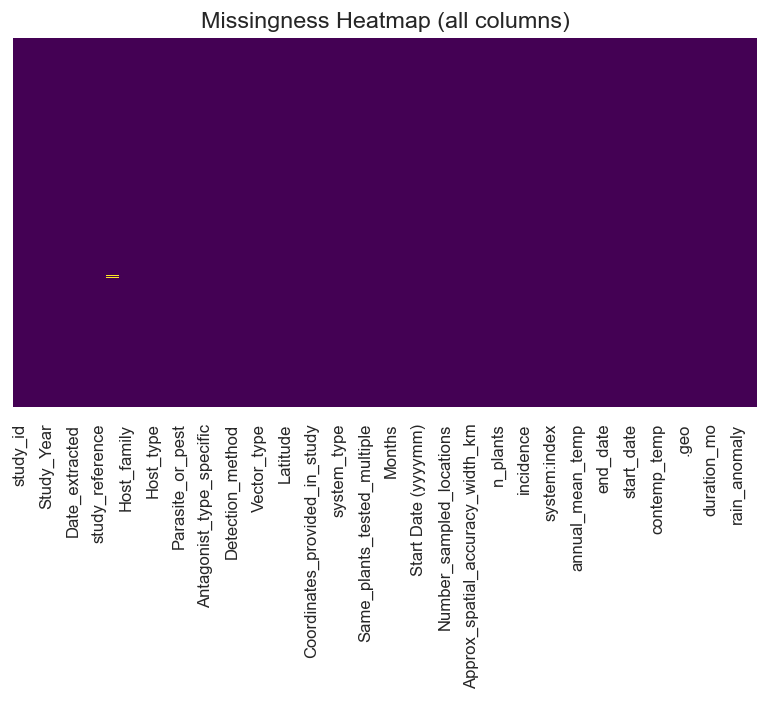


Missing values by climate‐column:
  • contemp_temp: 0
  • monthly_temp: 0
  • annual_mean_temp: 0
  • contemp_precip: 0
  • monthly_precip: 0
  • annual_precip: 0

Shape before outlier removal: (4932, 56)
Shape after climate‐outlier removal: (4040, 56)


In [6]:
plt.figure(figsize=(8, 4))
sns.heatmap(df.isnull(), cbar=False, yticklabels=False, cmap="viridis")
plt.title("Missingness Heatmap (all columns)")
plt.show()

# 3) Check that the six climate columns actually exist by name
climate_cols_actual = [
    "contemp_temp",  # your current temperature
    "monthly_temp",  # your monthly historical temperature
    "annual_mean_temp",  # your annual historical temperature
    "contemp_precip",  # your current precipitation
    "monthly_precip",  # your monthly historical precipitation
    "annual_precip",  # your annual historical precipitation
]

# Verify presence and count missing values
missing = {col: df[col].isnull().sum() for col in climate_cols_actual}
print("\nMissing values by climate‐column:")
for col, cnt in missing.items():
    print(f"  • {col}: {cnt}")

# 4) Exclude extreme outliers (bottom 2.5% / top 2.5%) on the continuous climate columns
print("\nShape before outlier removal:", df.shape)
for col in ["contemp_temp", "annual_mean_temp", "contemp_precip", "annual_precip"]:
    low, high = df[col].quantile(0.025), df[col].quantile(0.975)
    df = df[(df[col] >= low) & (df[col] <= high)]
print("Shape after climate‐outlier removal:", df.shape)

> All climate predictors should show zero missingness; any residual missingness
> indicates an ETL error.


<h2 style="color:#4E9A06; margin-top:1rem; margin-bottom:0.5rem;">
  2.2c Confirm uniformity in units across all columns
</h2>


In [7]:
print(
    "Raw 'contemp_temp' range:", df["contemp_temp"].min(), "→", df["contemp_temp"].max()
)
print(
    "Raw 'monthly_temp' range:  ",
    df["monthly_temp"].min(),
    "→",
    df["monthly_temp"].max(),
)
print(
    "Raw 'annual_mean_temp' range:",
    df["annual_mean_temp"].min(),
    "→",
    df["annual_mean_temp"].max(),
)


Raw 'contemp_temp' range: 283.6858536 → 300.2954854
Raw 'monthly_temp' range:   84.74077683 → 276.6608286
Raw 'annual_mean_temp' range: 38.55149958 → 258.6567237


In [8]:
# ────────────────────────────────────────────────────────────────────────────────
# 1) Convert temperature‐related columns into Celsius:
#
#   - contemp_temp is in Kelvin (≈ 280 → 303 K) → subtract 273.15
#   - monthly_temp and annual_mean_temp are in tenths of °C (WorldClim format)
#     → divide by 10 to get actual °C
# ────────────────────────────────────────────────────────────────────────────────

# (a) Convert the survey (contemporaneous) temperature from K → °C
df["contemp_temp_C"] = df["contemp_temp"] - 273.15

# (b) Convert WorldClim “monthly_temp” (tenths of °C) → °C
df["monthly_temp_C"] = df["monthly_temp"] / 10.0

# (c) Convert WorldClim “annual_mean_temp” (tenths of °C) → °C
df["annual_mean_temp_C"] = df["annual_mean_temp"] / 10.0

# ────────────────────────────────────────────────────────────────────────────────
# 2) Compute the true Celsius‐based temperature anomaly:
# ────────────────────────────────────────────────────────────────────────────────

df["temp_anomaly_C"] = df["contemp_temp_C"] - df["monthly_temp_C"]

# ────────────────────────────────────────────────────────────────────────────────
# 3) Re‐compute rainfall anomalies (if not already correct):
#
#   - contemp_precip is already mm/day
#   - monthly_precip and annual_precip are in mm/month → convert to mm/day by dividing by 30
# ────────────────────────────────────────────────────────────────────────────────

df["monthly_precip_mm_per_day"] = df["monthly_precip"] / 30.0
df["rain_anomaly_daily"] = df["contemp_precip"] - df["monthly_precip_mm_per_day"]
df["annual_precip_mm_per_day"] = df["annual_precip"] / 30.0

# ────────────────────────────────────────────────────────────────────────────────
# 4) Split into Wild vs. Agricultural subsets:
# ────────────────────────────────────────────────────────────────────────────────

wild_df = df[df["system_type"] == "Natural"].copy()
ag_df = df[df["system_type"] == "Ag"].copy()

# ────────────────────────────────────────────────────────────────────────────────
# 5) Sanity‐check the resulting ranges:
# ────────────────────────────────────────────────────────────────────────────────

print(
    "Wild temp anomaly (°C):",
    wild_df["temp_anomaly_C"].min(),
    "→",
    wild_df["temp_anomaly_C"].max(),
)
print(
    "Ag   temp anomaly (°C):",
    ag_df["temp_anomaly_C"].min(),
    "→",
    ag_df["temp_anomaly_C"].max(),
)

print(
    "Wild cont. temp (°C):",
    wild_df["contemp_temp_C"].min(),
    "→",
    wild_df["contemp_temp_C"].max(),
)
print(
    "Ag   cont. temp (°C):",
    ag_df["contemp_temp_C"].min(),
    "→",
    ag_df["contemp_temp_C"].max(),
)

print(
    "Wild rain anomaly (mm/day):",
    wild_df["rain_anomaly_daily"].min(),
    "→",
    wild_df["rain_anomaly_daily"].max(),
)
print(
    "Ag   rain anomaly (mm/day):",
    ag_df["rain_anomaly_daily"].min(),
    "→",
    ag_df["rain_anomaly_daily"].max(),
)


Wild temp anomaly (°C): -6.28902572999997 → 7.558733857487891
Ag   temp anomaly (°C): -7.289652942512124 → 7.819652957487914
Wild cont. temp (°C): 10.664716700000042 → 27.035363800000027
Ag   cont. temp (°C): 10.535853599999996 → 27.14548540000004
Wild rain anomaly (mm/day): -5.973570612666666 → -0.345448844
Ag   rain anomaly (mm/day): -9.861323083333334 → 5.55e-05


<h2 style="color:#4E9A06; margin-top:1rem; margin-bottom:0.5rem;">
  2.3 Population Distributions
</h2>


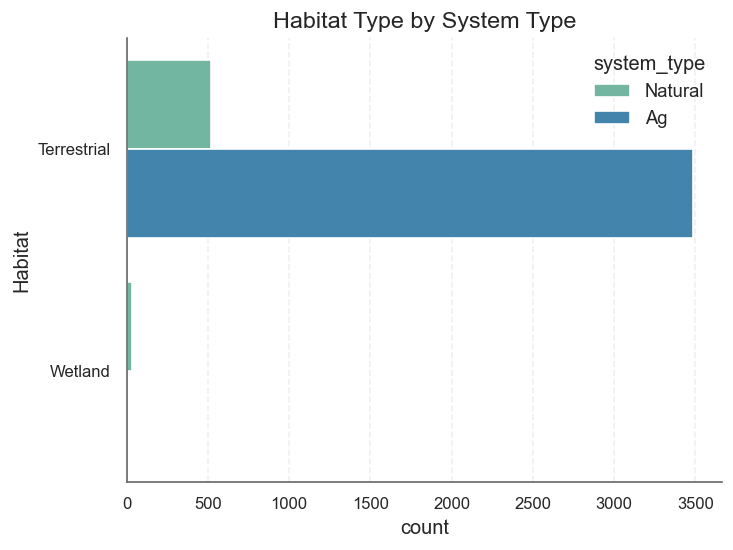

In [9]:
sns.countplot(
    data=df,
    y="Habitat",
    hue="system_type",
    palette={"Ag": AG_COLOR, "Natural": WILD_COLOR},
)
plt.title("Habitat Type by System Type")
plt.show()


>Insight: Shows frequency of habitat types split by wild vs agri systems.

In [10]:
df["Parasite_or_pest"] = df["Parasite_or_pest"].str.strip().str.capitalize()

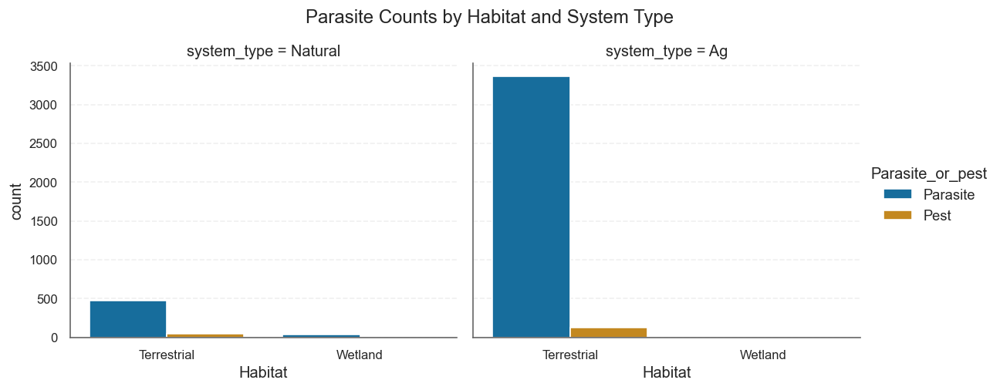

In [11]:
sns.catplot(
    data=df,
    x="Habitat",
    col="system_type",
    hue="Parasite_or_pest",
    kind="count",
    height=4,
    aspect=1.2,
)
plt.suptitle("Parasite Counts by Habitat and System Type", y=1.05)
plt.show()

>Insight: Highlights pathogen diversity across land use types.

<h3 style="color:#3E7A05; margin-top:0.75rem; margin-bottom:0.5rem;">
  2.3.1 Target Distribution
</h3>

C:\Users\baner\AppData\Local\Temp\ipykernel_25708\3751870751.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=inc_counts.index, y=inc_counts.values, palette="colorblind")


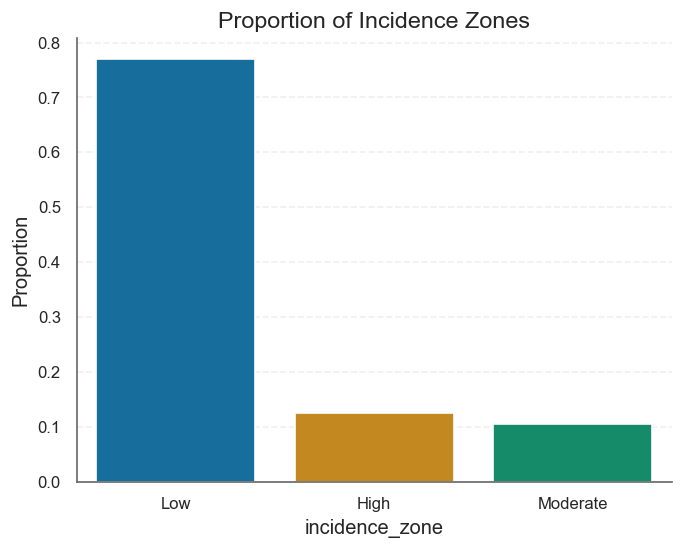

In [12]:
# Plot distribution of target: incidence_zone
inc_counts = df["incidence_zone"].value_counts(normalize=True)
sns.barplot(x=inc_counts.index, y=inc_counts.values, palette="colorblind")
plt.title("Proportion of Incidence Zones")
plt.ylabel("Proportion")
plt.show()

<!-- ──────────────────────────────────────────────────────────────────────── -->
<!-- Cell 5: Sub‐Section (H3) “2.3.2 Numerical Feature Distributions”          -->
<!-- ──────────────────────────────────────────────────────────────────────── -->
<h3 style="color:#3E7A05; margin-top:0.75rem; margin-bottom:0.5rem;">
  2.3.2 Distribution of Incidence
</h3>


Below, we visualize histograms and boxplots for key numerical features to check skewness, outliers, and general shape.


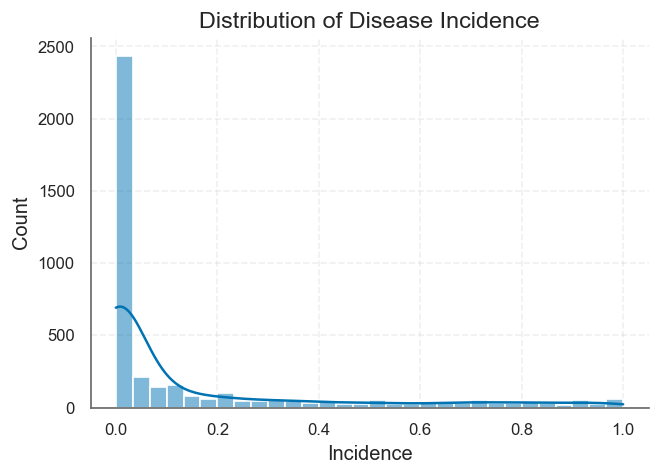

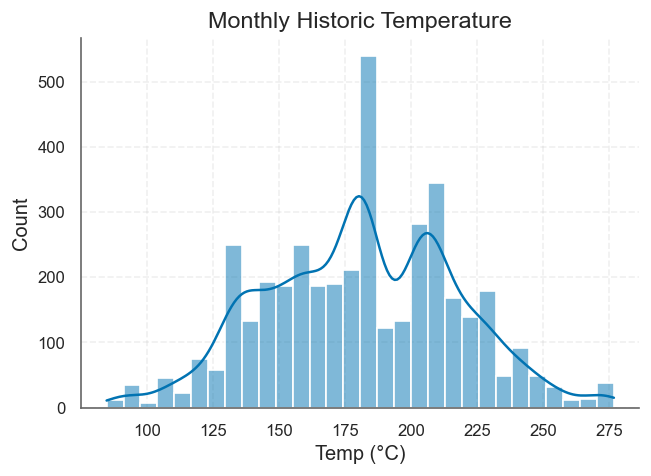

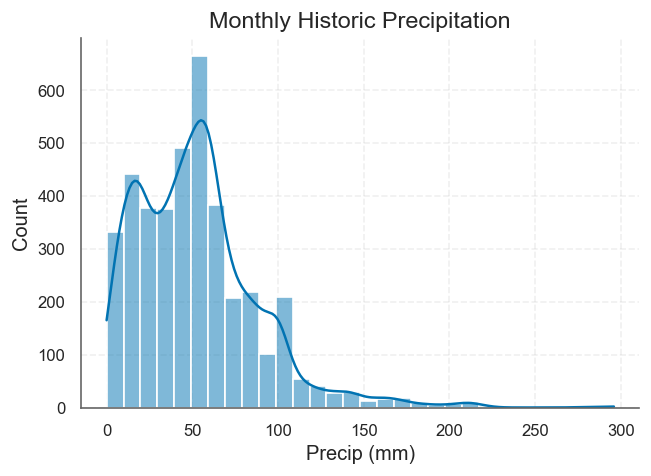

In [13]:
# 1) Switch to colorblind palette for all seaborn plots
cb = sns.set_palette("colorblind")

#  Disease Incidence
plt.figure(figsize=(6, 4))
sns.histplot(df["incidence"], bins=30, kde=True)
plt.title("Distribution of Disease Incidence")
plt.xlabel("Incidence")
plt.show()

#  Monthly Temperature
plt.figure(figsize=(6, 4))
sns.histplot(df["monthly_temp"], bins=30, kde=True)
plt.title("Monthly Historic Temperature")
plt.xlabel("Temp (°C)")
plt.show()

#  Monthly Precipitation
plt.figure(figsize=(6, 4))
sns.histplot(df["monthly_precip"], bins=30, kde=True)
plt.title("Monthly Historic Precipitation")
plt.xlabel("Precip (mm)")
plt.show()


In [14]:
# Univariate distribution stats & group overlays
for col in ["incidence", "monthly_temp", "monthly_precip"]:
    print(f"{col} skewness: {df[col].skew():.2f}, kurtosis: {df[col].kurtosis():.2f}")

incidence skewness: 1.87, kurtosis: 2.29
monthly_temp skewness: 0.00, kurtosis: -0.33
monthly_precip skewness: 1.38, kurtosis: 3.83


Insights:
- **Disease Incidence**:
  - Highly right-skewed distribution with a long tail, indicating most populations have low incidence but some have very high values.
  - Boxplot confirms presence of outliers, particularly in high-incidence zones.

- **Monthly Historic Temperature**:
  - Approximately symmetric (skewness ≈ 0.00, kurtosis = –0.33), reflecting a balanced distribution across temperate and warm climates.

- **Monthly Historic Precipitation**:
  - Right-skewed with heavy tails (skewness = 1.38, kurtosis = 3.83), suggesting rainfall is moderate in most regions but includes extreme wet events.


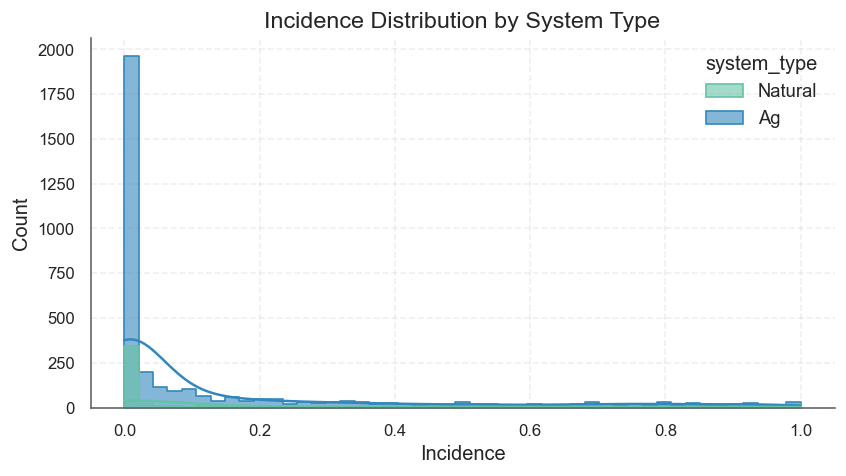

In [15]:
# Overlay incidence by system type using custom AG/WILD colors
plt.figure(figsize=(8, 4))

sns.histplot(
    data=df,
    x="incidence",
    hue="system_type",
    kde=True,
    palette={
        "Ag": AG_COLOR,
        "Natural": WILD_COLOR,
    },  # navy‐blue for Ag, greenish‐teal for Natural
    element="step",  # optional: draws outlines only
    alpha=0.6,  # optional: makes the fill semi‐transparent
)

plt.title("Incidence Distribution by System Type")
plt.xlabel("Incidence")
plt.ylabel("Count")
plt.show()


Both wild (‘Natural’) and agricultural (‘Ag’) systems show heavily right-skewed incidence (skewness ≈ 1.9), but agricultural records dominate the low-incidence peak, suggesting stronger suppression or reporting bias in managed systems

In [16]:
from scipy.stats import mannwhitneyu, ks_2samp

# Ensure consistent labels
df["system_type"] = df["system_type"].str.strip().str.capitalize()

# Extract incidence values for each system type
incidence_ag = df[df["system_type"] == "Ag"]["incidence"]
incidence_nat = df[df["system_type"] == "Natural"]["incidence"]

# Mann–Whitney U test (non-parametric test of central tendency)
u_stat, p_u = mannwhitneyu(incidence_ag, incidence_nat, alternative="two-sided")

# Kolmogorov–Smirnov test (sensitive to overall distribution differences)
ks_stat, p_ks = ks_2samp(incidence_ag, incidence_nat)

print(f"Mann–Whitney U test: U = {u_stat:.2f}, p = {p_u:.4e}")
print(f"Kolmogorov–Smirnov test: KS = {ks_stat:.3f}, p = {p_ks:.4e}")


Mann–Whitney U test: U = 1021849.50, p = 1.4415e-02
Kolmogorov–Smirnov test: KS = 0.116, p = 4.7279e-06


1. From Mann-Whitney U Test, There is a statistically significant difference in the central tendency of disease incidence between Natural and Agricultural systems.
   - This also means that wild systems exhibit higher variable disease levels than agricultural systems, which is consistent with expectations of pathogen suppression in managed environments. * We will explore this further for hypothesis #2 validation.
2. Kolmogorov-Smirnov test also indicates significant differences in the overall distribution of disease incidence between the two systems. The entire shape of the incidence distribution differs significantly between systems — not just the mean.

**How our incidence‐based categories (Low/Medium/High) are distributed across your two system types ?**

This will further help us *Spot imbalances*, *Plan for stratification*, and *Identify potential biases* for our stakeholders

In [17]:
# Categorical balance & crosstab
ct = pd.crosstab(df["incidence_zone"], df["system_type"], normalize="index")
print("Incidence Zone vs System Type:")
print(ct)

Incidence Zone vs System Type:
system_type           Ag   Natural
incidence_zone                    
High            0.837945  0.162055
Low             0.867524  0.132476
Moderate        0.863208  0.136792


- All three zones are dominated by Ag (~84–87 %), with only ~13–16 % in Wild.
- But the proportions are very similar across Low, Moderate and High, suggesting our incidence-zone cutoffs aren’t accidentally assigning, say, all “High” cases to Wild or vice versa.

<style>
.hypothesis-block {
    background: #222;
    color: #fff;
    border-radius: 8px;
    padding: 18px 20px 16px 20px;
    margin-bottom: 1.5em;
    box-shadow: 0 2px 8px rgba(0,0,0,0.08);
}
.hypothesis-block h2.hypothesis-title {
    color: #4E9A06;
    font-weight: bold;
    font-size: 1.15em;
    margin-bottom: 0.5em;
    display: block;
}
</style>

<div class="hypothesis-block">
  <h2 class="hypothesis-title">Hypothesis 1: Weather, Anomaly &amp; Historical Climate Effects</h2>
  <b>Technical Statement:</b><br>
  Contemporaneous weather (mean temperature or precipitation during a survey), deviations from monthly normals (“anomalies”), and long-term historical climate each independently influence plant-disease prevalence.<br><br>
  <b>Plain-Language Version:</b><br>
  Both recent weather (e.g., this month’s temperature or rainfall) and how that weather differs from what is “normally” expected—plus the usual long-term climate in that location—all affect how many plants become infected.
</div>


**Validation:**

We’ll explore three climate‐incidence relationships:

- Contemporaneous Weather
- Weather Anomalies
- Long-term Historical Climate

For each, we’ll (a) plot incidence against the predictor, (b) compute a Spearman rank‐correlation (to capture any monotonic trend), and (c) summarize the strength and significance.

1. **Range of Temperature Anomalies**

First, we check that our anomaly predictor actually varies enough to test its effect.

Let us first look at the histogram of `temp_anomaly_C` so we can see the full anomaly distribution, vertical line at 0

Text(0, 0.5, '')

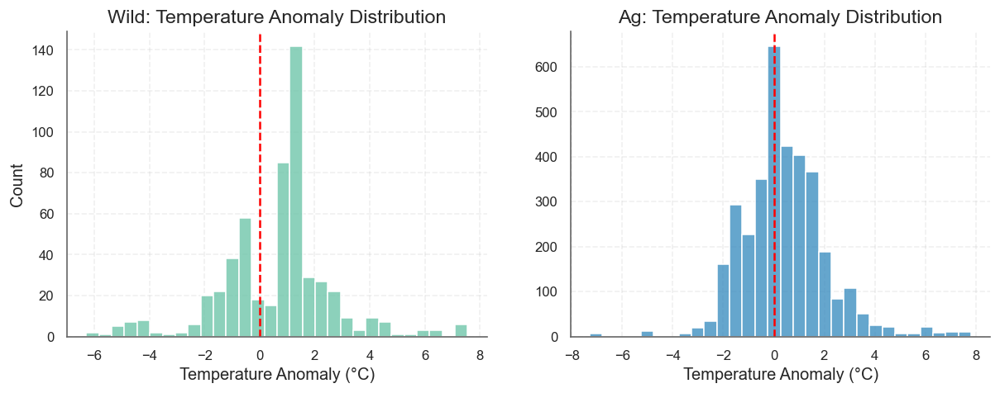

In [18]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharey=False)
sns.histplot(wild_df["temp_anomaly_C"], bins=30, color=WILD_COLOR, kde=False, ax=ax[0])
ax[0].axvline(0, color="red", linestyle="--", lw=1.5)
ax[0].set_title("Wild: Temperature Anomaly Distribution")
ax[0].set_xlabel("Temperature Anomaly (°C)")
ax[0].set_ylabel("Count")

sns.histplot(ag_df["temp_anomaly_C"], bins=30, color=AG_COLOR, kde=False, ax=ax[1])
ax[1].axvline(0, color="red", linestyle="--", lw=1.5)
ax[1].set_title("Ag: Temperature Anomaly Distribution")
ax[1].set_xlabel("Temperature Anomaly (°C)")
ax[1].set_ylabel("")

- Both systems are centered around zero (dashed line), but anomalies span roughly –6 °C to +8 °C in wild sites (and a similar—but much larger—sample in ag sites).

- This wide coverage ensures that when we later test “anomaly → incidence,” we’re not restricted to tiny departures from normal.

1. Incidence vs. Contemporaneous Temperature

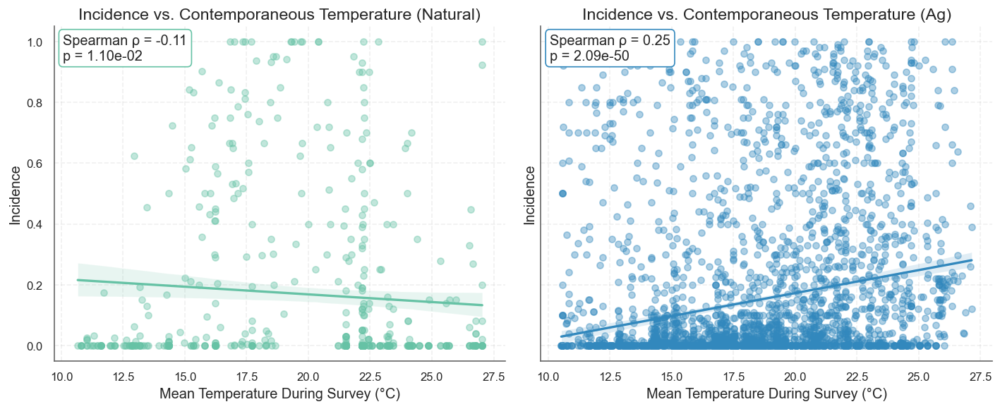

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr


# 1) Define a little helper to plot + test each group
def plot_and_test(system, color, ax):
    sub = df[df["system_type"] == system]

    # Scatter + regression line
    sns.regplot(
        x="contemp_temp_C",
        y="incidence",
        data=sub,
        scatter_kws={"alpha": 0.4, "s": 30, "color": color},
        line_kws={"color": color, "lw": 2},
        ax=ax,
    )
    ax.set_title(f"Incidence vs. Contemporaneous Temperature ({system})")
    ax.set_xlabel("Mean Temperature During Survey (°C)")
    ax.set_ylabel("Incidence")

    # Spearman test
    rho, pval = spearmanr(sub["contemp_temp_C"], sub["incidence"])
    ax.text(
        0.02,
        0.90,
        f"Spearman ρ = {rho:.2f}\np = {pval:.2e}",
        transform=ax.transAxes,
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=color, lw=1),
    )
    return rho, pval


# 2) Create side-by-side subplots
fig, (ax_nat, ax_ag) = plt.subplots(1, 2, figsize=(12, 5), sharex=True, sharey=True)

rho_nat, p_nat = plot_and_test("Natural", WILD_COLOR, ax_nat)
rho_ag, p_ag = plot_and_test("Ag", AG_COLOR, ax_ag)

plt.tight_layout()
plt.show()


 - Agricultural systems show a clear, significant positive relationship between contemporaneous temperature and disease incidence (Spearman ρ = 0.25, p ≈ 2×10⁻⁵⁰), indicating that warmer survey months tend to have higher crop disease prevalence.

 - Wild systems exhibit a weak, slightly negative correlation (Spearman ρ = −0.11, p ≈ 0.011), suggesting that temperature alone does not predict—and may even modestly suppress—disease in unmanaged plant populations.

 - Take‐away: **Contemporaneous temperature does influence disease in agricultural settings (supporting the weather‐effect portion of H1), but the same simple effect is absent—or reversed—in wild systems.**

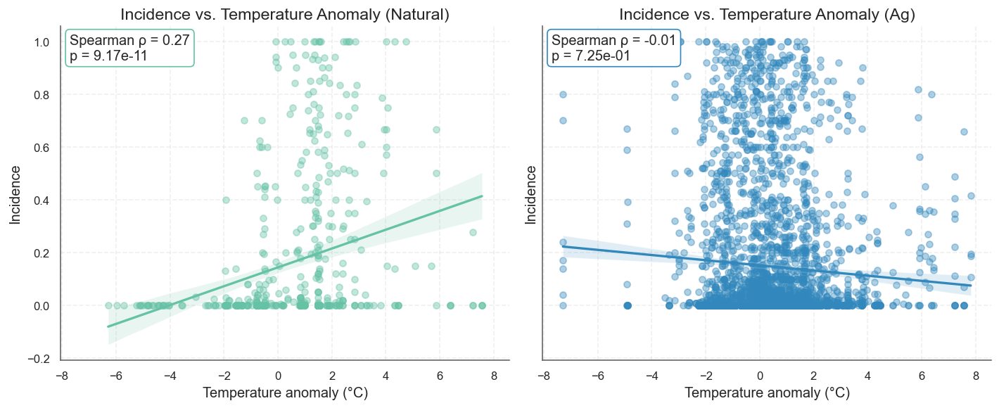

In [20]:
from scipy import stats
from scipy.stats import spearmanr


# 1) Extend the helper to accept any x-column + labels
def plot_and_test(system, color, ax, x_col, x_label, title_suffix):
    sub = df[df["system_type"] == system]

    # Scatter + regression line
    sns.regplot(
        x=x_col,
        y="incidence",
        data=sub,
        scatter_kws={"alpha": 0.4, "s": 30, "color": color},
        line_kws={"color": color, "lw": 2},
        ax=ax,
    )
    ax.set_title(f"Incidence vs. {title_suffix} ({system})")
    ax.set_xlabel(x_label)
    ax.set_ylabel("Incidence")

    # Spearman test
    rho, pval = spearmanr(sub[x_col], sub["incidence"])
    ax.text(
        0.02,
        0.90,
        f"Spearman ρ = {rho:.2f}\np = {pval:.2e}",
        transform=ax.transAxes,
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=color, lw=1),
    )
    return rho, pval


# ----------------------------------------------------
# B) Incidence vs Temperature Anomaly
# ----------------------------------------------------
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), sharex=True, sharey=True)

rho_nat, p_nat = plot_and_test(
    "Natural",
    WILD_COLOR,
    ax1,
    x_col="temp_anomaly_C",
    x_label="Temperature anomaly (°C)",
    title_suffix="Temperature Anomaly",
)

rho_ag, p_ag = plot_and_test(
    "Ag",
    AG_COLOR,
    ax2,
    x_col="temp_anomaly_C",
    x_label="Temperature anomaly (°C)",
    title_suffix="Temperature Anomaly",
)

plt.tight_layout()
plt.show()


 - Natural systems – Temperature anomaly
Moderate positive monotonic trend (Spearman ρ = 0.27, p ≈ 9.2 × 10⁻¹¹): disease incidence in wild plants rises as monthly temperatures exceed their historical normals.

 - Agricultural systems – Temperature anomaly
No meaningful association (Spearman ρ ≈ –0.01, p = 0.73): crop disease prevalence is essentially insensitive to short-term temperature deviations.

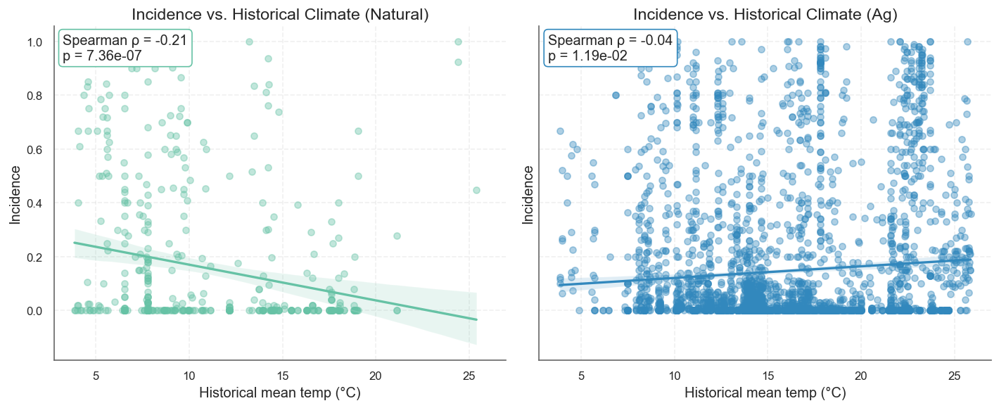

In [21]:
# ====================================================
# C) Incidence vs Long-term Historical Climate
#    (using annual mean temperature here)
# ====================================================

fig, (ax3, ax4) = plt.subplots(1, 2, figsize=(12, 5), sharex=True, sharey=True)

rho_nat_h, p_nat_h = plot_and_test(
    "Natural",
    WILD_COLOR,
    ax3,
    x_col="annual_mean_temp_C",
    x_label="Historical mean temp (°C)",
    title_suffix="Historical Climate",
)

rho_ag_h, p_ag_h = plot_and_test(
    "Ag",
    AG_COLOR,
    ax4,
    x_col="annual_mean_temp_C",
    x_label="Historical mean temp (°C)",
    title_suffix="Historical Climate",
)

plt.tight_layout()
plt.show()

 - Natural systems – Historical climate
Moderate negative trend (Spearman ρ = –0.21, p ≈ 7.4 × 10⁻⁷): wild plant disease is lower in regions with higher long-term average temperatures.

 - Agricultural systems – Historical climate
Negligible negative association (Spearman ρ = –0.04, p = 0.012): although statistically detectable, the effect of year-round warmth on crop disease is vanishingly small.

Let us visualize a residual plot for our straight line fit to the data, which will help us assess the linearity assumption and identify any patterns in the residuals.

=== Ag: Incidence ~ Temperature Anomaly ===
                            OLS Regression Results                            
Dep. Variable:              incidence   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     14.15
Date:                Tue, 10 Jun 2025   Prob (F-statistic):           0.000171
Time:                        09:44:07   Log-Likelihood:                -215.30
No. Observations:                3488   AIC:                             434.6
Df Residuals:                    3486   BIC:                             446.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------


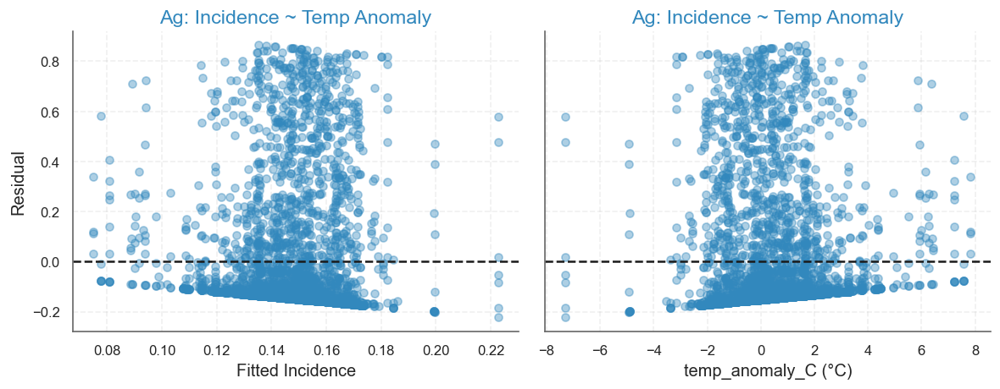

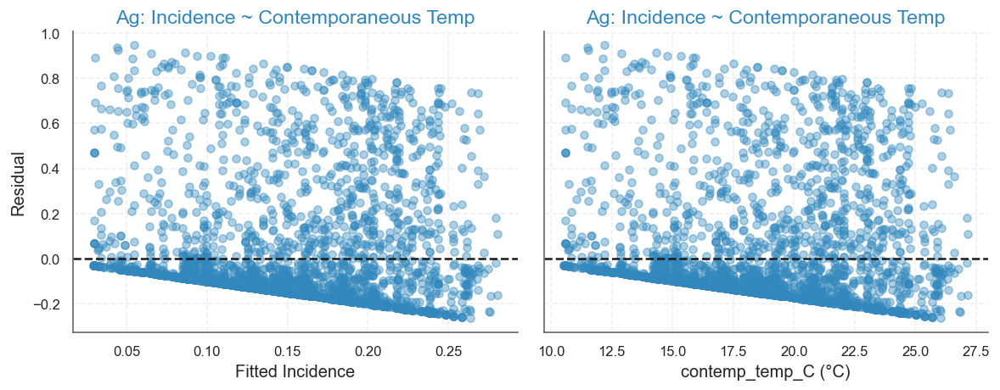

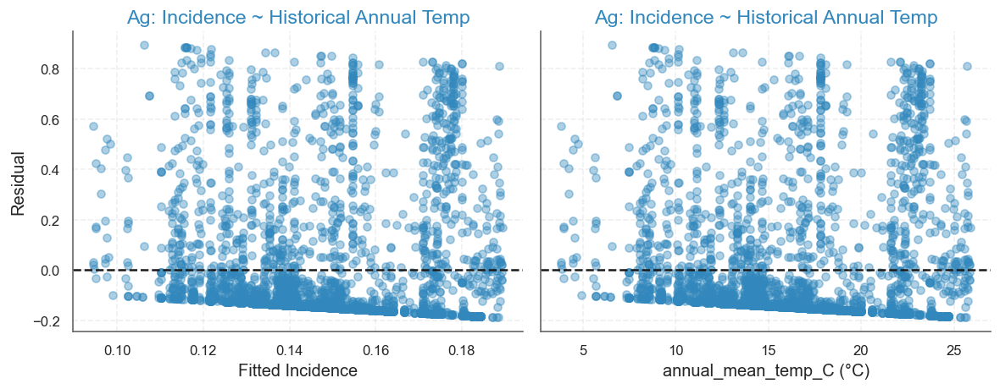

In [22]:
import statsmodels.formula.api as smf

# 1) Ensure ag_df is defined
#    (assumes you have already done: ag_df = df[df["system_type"] == "Ag"].copy())

# ───────────────────────────────────────────────────────────────────────────
# (A) Fit & Summarize Linear Models
# ───────────────────────────────────────────────────────────────────────────

# (A1) Ag: Incidence ~ Temperature Anomaly
model_ag_anom = smf.ols("incidence ~ temp_anomaly_C", data=ag_df).fit()
print("=== Ag: Incidence ~ Temperature Anomaly ===")
print(model_ag_anom.summary(), "\n\n")

# (A2) Ag: Incidence ~ Contemporaneous Temperature
model_ag_contemp = smf.ols("incidence ~ contemp_temp_C", data=ag_df).fit()
print("=== Ag: Incidence ~ Contemporaneous Temperature ===")
print(model_ag_contemp.summary(), "\n\n")

# (A3) Ag: Incidence ~ Historical Annual Temperature
model_ag_hist = smf.ols("incidence ~ annual_mean_temp_C", data=ag_df).fit()
print("=== Ag: Incidence ~ Historical Annual Temperature ===")
print(model_ag_hist.summary(), "\n\n")

# ───────────────────────────────────────────────────────────────────────────
# (B) Colored Residual Diagnostics Function
# ───────────────────────────────────────────────────────────────────────────


def plot_lin_diagnostics(model, df_sub, xcol, title_prefix, color):
    resid = model.resid
    fitted = model.fittedvalues
    x = df_sub[xcol]

    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
    # Residuals vs Fitted
    axes[0].scatter(fitted, resid, color=color, alpha=0.4, s=30)
    axes[0].axhline(0, color="k", ls="--")
    axes[0].set_title(f"{title_prefix}", color=color)
    axes[0].set_xlabel("Fitted Incidence")
    axes[0].set_ylabel("Residual")

    # Residuals vs Predictor
    axes[1].scatter(x, resid, color=color, alpha=0.4, s=30)
    axes[1].axhline(0, color="k", ls="--")
    axes[1].set_title(f"{title_prefix}", color=color)
    axes[1].set_xlabel(f"{xcol} (°C)")

    plt.tight_layout()
    plt.show()


# ───────────────────────────────────────────────────────────────────────────
# (C) Plot Diagnostics for Each Ag Model
# ───────────────────────────────────────────────────────────────────────────

plot_lin_diagnostics(
    model_ag_anom,
    ag_df,
    "temp_anomaly_C",
    "Ag: Incidence ~ Temp Anomaly",
    color=AG_COLOR,
)

plot_lin_diagnostics(
    model_ag_contemp,
    ag_df,
    "contemp_temp_C",
    "Ag: Incidence ~ Contemporaneous Temp",
    color=AG_COLOR,
)

plot_lin_diagnostics(
    model_ag_hist,
    ag_df,
    "annual_mean_temp_C",
    "Ag: Incidence ~ Historical Annual Temp",
    color=AG_COLOR,
)


- **Best‐fit driver:** Contemporaneous temperature explains ~4 % of the variance (vs < 1 % for anomaly or historical climate).


- **Signs:** Warmer current months → slightly higher disease; surprisingly, anomalously hot months → slightly lower incidence.

- **Diagnostics:**

  - The residual‐vs‐fitted plots show a clear “wedge” (heteroskedasticity): residuals systematically get more negative as fitted incidence rises, suggesting non‐linearity.

  - Residuals vs. predictor similarly fan out, hinting that a quadratic term (or a more flexible fit) might capture the curvature you’re seeing.

=== Natural: Incidence ~ Temperature Anomaly ===
                            OLS Regression Results                            
Dep. Variable:              incidence   R-squared:                       0.063
Model:                            OLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     37.26
Date:                Tue, 10 Jun 2025   Prob (F-statistic):           1.95e-09
Time:                        09:44:09   Log-Likelihood:                -83.178
No. Observations:                 552   AIC:                             170.4
Df Residuals:                     550   BIC:                             179.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

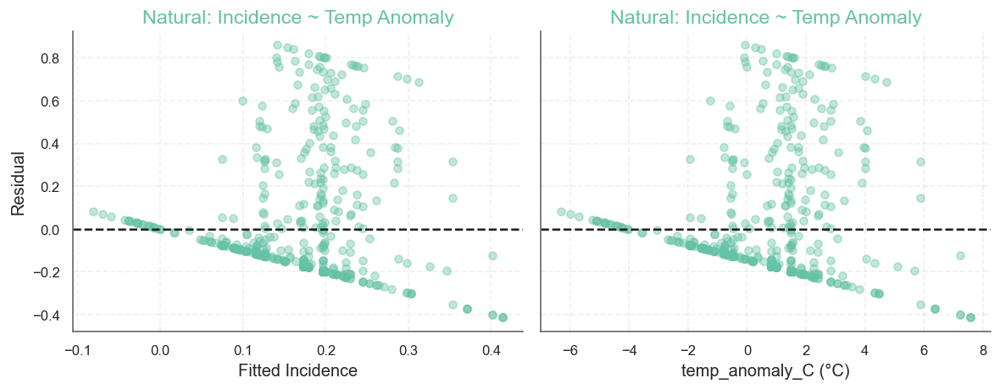

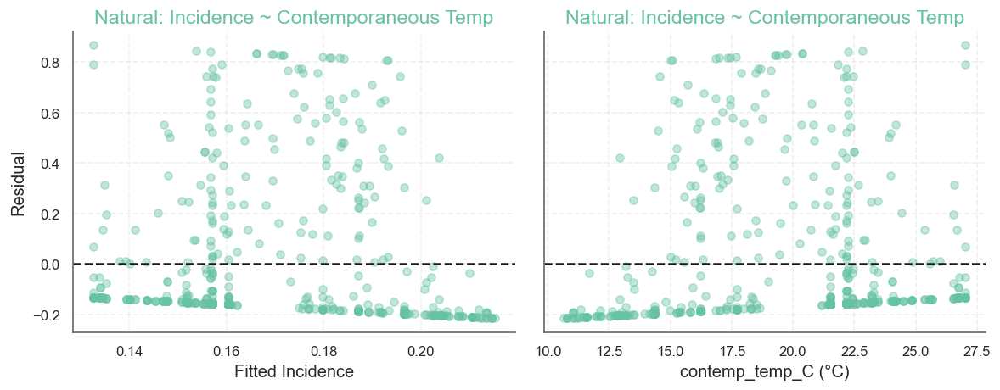

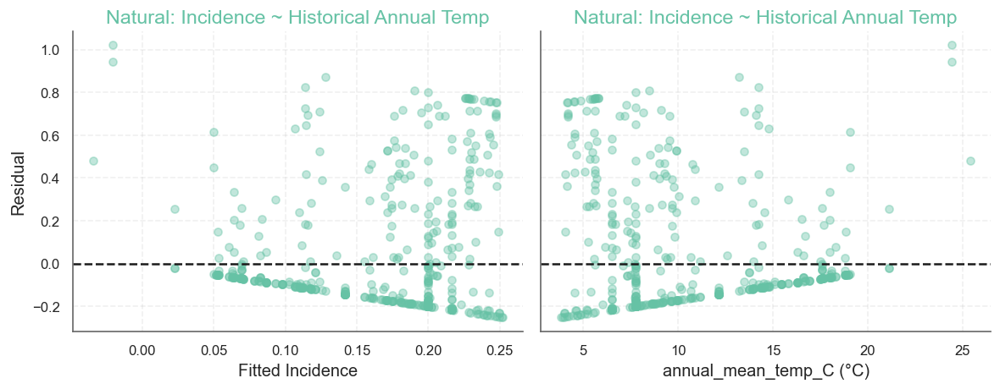

In [23]:
# ───────────────────────────────────────────────────────────────────────────
# 1) Prepare the Natural subset
# ───────────────────────────────────────────────────────────────────────────
natural_df = df[df["system_type"] == "Natural"].copy()

# ───────────────────────────────────────────────────────────────────────────
# 2) Fit & Summarize Linear Models for Natural
# ───────────────────────────────────────────────────────────────────────────

# (2a) Incidence ~ Temperature Anomaly
model_nat_anom = smf.ols("incidence ~ temp_anomaly_C", data=natural_df).fit()
print("=== Natural: Incidence ~ Temperature Anomaly ===")
print(model_nat_anom.summary(), "\n\n")

# (2b) Incidence ~ Contemporaneous Temperature
model_nat_contemp = smf.ols("incidence ~ contemp_temp_C", data=natural_df).fit()
print("=== Natural: Incidence ~ Contemporaneous Temperature ===")
print(model_nat_contemp.summary(), "\n\n")

# (2c) Incidence ~ Historical Annual Temperature
model_nat_hist = smf.ols("incidence ~ annual_mean_temp_C", data=natural_df).fit()
print("=== Natural: Incidence ~ Historical Annual Temperature ===")
print(model_nat_hist.summary(), "\n\n")

# ───────────────────────────────────────────────────────────────────────────
# 3) Residual Diagnostics Helper (reuse from Ag)
# ───────────────────────────────────────────────────────────────────────────


def plot_lin_diagnostics(model, df_sub, xcol, title_prefix, color):
    """
    model         : a fitted statsmodels OLS
    df_sub        : the DataFrame you fit it on
    xcol          : name of the predictor column (e.g. "temp_anomaly_C")
    title_prefix  : string, e.g. "Natural: Incidence ~ Temp Anomaly"
    color         : a matplotlib‐compatible color for points & titles
    """
    resid = model.resid
    fitted = model.fittedvalues
    x = df_sub[xcol]

    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

    # Residuals vs Fitted
    axes[0].scatter(fitted, resid, color=color, alpha=0.4, s=30)
    axes[0].axhline(0, color="k", ls="--")
    axes[0].set_title(f"{title_prefix}", color=color)
    axes[0].set_xlabel("Fitted Incidence")
    axes[0].set_ylabel("Residual")

    # Residuals vs Predictor
    axes[1].scatter(x, resid, color=color, alpha=0.4, s=30)
    axes[1].axhline(0, color="k", ls="--")
    axes[1].set_title(f"{title_prefix}", color=color)
    axes[1].set_xlabel(f"{xcol} (°C)")

    plt.tight_layout()
    plt.show()


# ───────────────────────────────────────────────────────────────────────────
# 4) Plot Diagnostics for Each Natural Model
# ───────────────────────────────────────────────────────────────────────────

# 4a) Temperature Anomaly
plot_lin_diagnostics(
    model_nat_anom,
    natural_df,
    "temp_anomaly_C",
    "Natural: Incidence ~ Temp Anomaly",
    color=WILD_COLOR,
)

# 4b) Contemporaneous Temperature
plot_lin_diagnostics(
    model_nat_contemp,
    natural_df,
    "contemp_temp_C",
    "Natural: Incidence ~ Contemporaneous Temp",
    color=WILD_COLOR,
)

# 4c) Historical Annual Temperature
plot_lin_diagnostics(
    model_nat_hist,
    natural_df,
    "annual_mean_temp_C",
    "Natural: Incidence ~ Historical Annual Temp",
    color=WILD_COLOR,
)


- **Best‐fit driver:** Temperature anomaly alone explains ~6 % of the variance, far more than contemporaneous (0.5 %) or annual climate (4 %).

- **Signs:** Wild plants get more disease when the current month is unusually warm relative to the norm (≈ +0.036 incidence per °C anomaly), and overall hotter climates have less disease (–0.013 per °C of annual mean).

- **Diagnostics:**

  - The residuals vs. fitted again form a wedge, and residuals vs. anomaly show a slight non‐linear trend—exactly why adding a quadratic anomaly term improved the mixed‐effects models.

  - No strong pattern in residual vs. contemporaneous temperature (consistent with the non‐significant OLS slope).

**Why move from a straight line to a quadratic?**

If the true relationship between incidence and temperature (or anomaly, or historical climate) were linear, a simple OLS fit would leave randomly scattered residuals around zero. Instead, what we actually see is:

- Systematic curvature in the residuals vs. fitted‐value plots (a “U-shape” or inverted “U”)
- Patterned bias in the residuals vs. raw predictor (e.g. residuals all negative at both low and high ends of the predictor, and positive in the middle)

That kind of pattern violates the OLS assumption of linearity and homoscedasticity, and tells us we’re missing a higher-order term. A quadratic model will “bend” to capture that curvature, flatten out the residual pattern, and better isolate the main effects we care about.

In [24]:
import statsmodels.api as sm

#  Sanity‐check the numeric ranges  ---
print(
    "Wild temp anomaly (°C):",
    wild_df["temp_anomaly_C"].min(),
    "→",
    wild_df["temp_anomaly_C"].max(),
)
print(
    "Ag   temp anomaly (°C):",
    ag_df["temp_anomaly_C"].min(),
    "→",
    ag_df["temp_anomaly_C"].max(),
)
print(
    "Wild cont. temp (°C):",
    wild_df["contemp_temp_C"].min(),
    "→",
    wild_df["contemp_temp_C"].max(),
)
print(
    "Ag   cont. temp (°C):",
    ag_df["contemp_temp_C"].min(),
    "→",
    ag_df["contemp_temp_C"].max(),
)
print(
    "Wild rain anomaly (mm/day):",
    wild_df["rain_anomaly_daily"].min(),
    "→",
    wild_df["rain_anomaly_daily"].max(),
)
print(
    "Ag   rain anomaly (mm/day):",
    ag_df["rain_anomaly_daily"].min(),
    "→",
    ag_df["rain_anomaly_daily"].max(),
)


# ───────────────────────────────────────────────────────────────────────────
# DEFINE A HELPER TO FIT QUADRATIC + 95 % CI (OLS version)
# ───────────────────────────────────────────────────────────────────────────


def fit_quadratic_and_ci(df_sub, xcol, ycol, x_min=None, x_max=None, npoints=200):
    """
    Fit y ~ 1 + x + x^2 by OLS, then return:
      - x_pred (dense grid from x_min to x_max)
      - y_pred (fitted mean)
      - lower_ci / upper_ci (95% conf. interval bounds for the mean)
    Assumes df_sub[xcol] and df_sub[ycol] exist.
    """
    # (1) Build design matrix with intercept + x + x^2
    X = pd.DataFrame(
        {"const": 1.0, "x1": df_sub[xcol].values, "x2": (df_sub[xcol].values ** 2)}
    )
    y = df_sub[ycol].values

    # (2) Fit OLS
    model = sm.OLS(y, X).fit()

    # (3) Determine x‐range for predictions
    if x_min is None:
        x_min = df_sub[xcol].min()
    if x_max is None:
        x_max = df_sub[xcol].max()
    x_pred = np.linspace(x_min, x_max, npoints)

    # (4) Build new design matrix for the grid
    X_pred = pd.DataFrame({"const": 1.0, "x1": x_pred, "x2": x_pred**2})

    # (5) Get the mean prediction + 95% CI
    summary_frame = model.get_prediction(X_pred).summary_frame(alpha=0.05)
    # summary_frame contains "mean", "mean_ci_lower", "mean_ci_upper", etc.

    return (
        x_pred,
        summary_frame["mean"],
        summary_frame["mean_ci_lower"],
        summary_frame["mean_ci_upper"],
    )


Wild temp anomaly (°C): -6.28902572999997 → 7.558733857487891
Ag   temp anomaly (°C): -7.289652942512124 → 7.819652957487914
Wild cont. temp (°C): 10.664716700000042 → 27.035363800000027
Ag   cont. temp (°C): 10.535853599999996 → 27.14548540000004
Wild rain anomaly (mm/day): -5.973570612666666 → -0.345448844
Ag   rain anomaly (mm/day): -9.861323083333334 → 5.55e-05


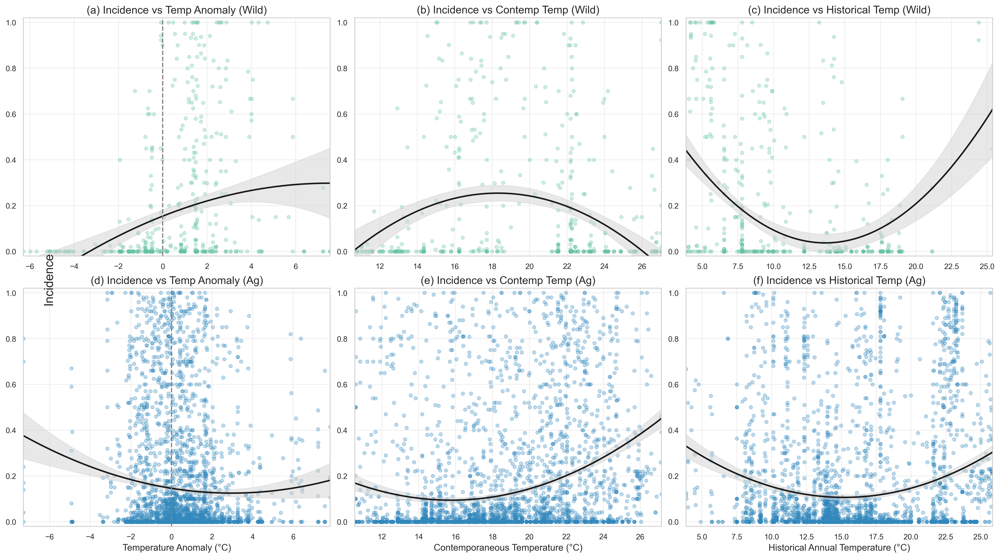

In [25]:
# (B) Helper to fit y ~ 1 + x + x^2 and get 95 % CI
def fit_quadratic_and_ci(df_sub, xcol, ycol, x_min=None, x_max=None, npoints=200):
    X = pd.DataFrame(
        {"const": 1.0, "x1": df_sub[xcol].values, "x2": df_sub[xcol].values ** 2}
    )
    y = df_sub[ycol].values
    model = sm.OLS(y, X).fit()
    if x_min is None:
        x_min = df_sub[xcol].min()
    if x_max is None:
        x_max = df_sub[xcol].max()
    x_pred = np.linspace(x_min, x_max, npoints)
    Xp = pd.DataFrame({"const": 1.0, "x1": x_pred, "x2": x_pred**2})
    pf = model.get_prediction(Xp).summary_frame(alpha=0.05)
    return x_pred, pf["mean"], pf["mean_ci_lower"], pf["mean_ci_upper"]


# (C) Plot the 2×3 grid with scatter + quadratic fit + shaded 95 % CI
sns.set_style("whitegrid")
plt.rcParams["figure.dpi"] = 300
fig, axes = plt.subplots(2, 3, figsize=(18, 10), constrained_layout=True)

panels = [
    ("a", wild_df, "temp_anomaly_C", WILD_COLOR, "Incidence vs Temp Anomaly (Wild)"),
    ("b", wild_df, "contemp_temp_C", WILD_COLOR, "Incidence vs Contemp Temp (Wild)"),
    (
        "c",
        wild_df,
        "annual_mean_temp_C",
        WILD_COLOR,
        "Incidence vs Historical Temp (Wild)",
    ),
    ("d", ag_df, "temp_anomaly_C", AG_COLOR, "Incidence vs Temp Anomaly (Ag)"),
    ("e", ag_df, "contemp_temp_C", AG_COLOR, "Incidence vs Contemp Temp (Ag)"),
    ("f", ag_df, "annual_mean_temp_C", AG_COLOR, "Incidence vs Historical Temp (Ag)"),
]

for idx, (letter, sdf, xcol, color, title) in enumerate(panels):
    ax = axes[idx // 3, idx % 3]
    ax.scatter(sdf[xcol], sdf["incidence"], color=color, alpha=0.3, s=20)
    x_pred, yhat, lo, hi = fit_quadratic_and_ci(sdf, xcol, "incidence")
    ax.plot(x_pred, yhat, "k-", lw=2)
    ax.fill_between(x_pred, lo, hi, color="lightgray", alpha=0.5)
    if xcol == "temp_anomaly_C":
        ax.axvline(0, color="gray", ls="--")
    ax.set_title(f"({letter}) {title}")
    ax.set_xlim(x_pred.min(), x_pred.max())
    ax.set_ylim(-0.02, 1.02)

# Shared labels
fig.text(0.04, 0.5, "Incidence", va="center", rotation="vertical", fontsize=16)
axes[1, 0].set_xlabel("Temperature Anomaly (°C)")
axes[1, 1].set_xlabel("Contemporaneous Temperature (°C)")
axes[1, 2].set_xlabel("Historical Annual Temperature (°C)")
plt.show()


- Wild systems (top row):

    - Temp anomaly (panel a): strongly concave–down (peak near +2–3 °C).

    - Contemp temp (b): clear unimodal hump around ~18 °C.

    - Historical temp (c): U‐shaped curve, with lowest incidence near ~13 °C.
    → All three predictors show pronounced, non‐flat curves.

- Agricultural systems (bottom row):

    - Temp anomaly (d): very weak curvature, almost flat.

    - Contemp temp (e): mostly an upward trend, very little mid‐range peak.

    - Historical temp (f): very shallow U shape.
    → All three curves are much flatter—the signal is weak.

Now, finally lets test the statistical significance of each quadratic fit

In [26]:
# ───────────────────────────────────────────────────────────────────────────
# (A) Helper to fit y ~ 1 + x + x^2 and print summary
# ───────────────────────────────────────────────────────────────────────────
def summarize_quadratic(df_sub, xcol, ycol):
    X = pd.DataFrame({"const": 1.0, "x1": df_sub[xcol], "x2": df_sub[xcol] ** 2})
    y = df_sub[ycol]
    model = sm.OLS(y, X).fit()
    print(f"\n======================\nQUADRATIC OLS: {xcol} → {ycol}")
    print(model.summary())
    return model


# ───────────────────────────────────────────────────────────────────────────
# (B) Fit & print for each of the six panels
# ───────────────────────────────────────────────────────────────────────────
# Wild systems:
mod_wild_anom = summarize_quadratic(wild_df, "temp_anomaly_C", "incidence")
mod_wild_contemp = summarize_quadratic(wild_df, "contemp_temp_C", "incidence")
mod_wild_hist = summarize_quadratic(wild_df, "annual_mean_temp_C", "incidence")

# Ag systems:
mod_ag_anom = summarize_quadratic(ag_df, "temp_anomaly_C", "incidence")
mod_ag_contemp = summarize_quadratic(ag_df, "contemp_temp_C", "incidence")
mod_ag_hist = summarize_quadratic(ag_df, "annual_mean_temp_C", "incidence")


QUADRATIC OLS: temp_anomaly_C → incidence
                            OLS Regression Results                            
Dep. Variable:              incidence   R-squared:                       0.069
Model:                            OLS   Adj. R-squared:                  0.065
Method:                 Least Squares   F-statistic:                     20.25
Date:                Tue, 10 Jun 2025   Prob (F-statistic):           3.27e-09
Time:                        09:44:16   Log-Likelihood:                -81.627
No. Observations:                 552   AIC:                             169.3
Df Residuals:                     549   BIC:                             182.2
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const    

In [27]:
# ───────────────────────────────────────────────────────────────────────────
# (C) Build a summary table of R², Adj. R², p-values for x1 and x2, plus Interpretation
# ───────────────────────────────────────────────────────────────────────────
models = [
    ("Wild • Anomaly", mod_wild_anom),
    ("Wild • Contemp", mod_wild_contemp),
    ("Wild • Historical", mod_wild_hist),
    ("Ag   • Anomaly", mod_ag_anom),
    ("Ag   • Contemp", mod_ag_contemp),
    ("Ag   • Historical", mod_ag_hist),
]

rows = []
for label, m in models:
    rows.append(
        {
            "Relationship": label,
            "R²": m.rsquared,
            "Adj. R²": m.rsquared_adj,
            "p (linear term)": m.pvalues["x1"],
            "p (quad term)": m.pvalues["x2"],
        }
    )

summary_temp = pd.DataFrame(rows)


# define an interpreter function
def interpret(row):
    lin_sig = row["p (linear term)"] < 0.05
    quad_sig = row["p (quad term)"] < 0.05
    if lin_sig and quad_sig:
        sig_txt = "Both linear & quadratic terms significant"
    elif lin_sig:
        sig_txt = "Linear term significant, quadratic not"
    elif quad_sig:
        sig_txt = "Quadratic term significant, linear not"
    else:
        sig_txt = "Neither term significant"
    return f"{sig_txt}; explains ~{row['R²'] * 100:.1f}% of variance"


# apply it
summary_temp["Interpretation"] = summary_temp.apply(interpret, axis=1)

# round and display
pd.set_option("display.precision", 4)
# allow up to e.g. 80 characters before truncating
pd.set_option("display.max_colwidth", 80)
display(summary_temp)


,Relationship,R²,Adj. R²,p (linear term),p (quad term),Interpretation
0,Wild • Anomaly,0.0687,0.0653,4.2736e-10,7.9164e-02,"Linear term significant, quadratic not; explains ~6.9% of variance"
1,Wild • Contemp,0.0740,0.0706,1.5728e-09,3.7461e-10,Both linear & quadratic terms significant; explains ~7.4% of variance
2,Wild • Historical,0.1153,0.1120,9.5902e-14,1.7132e-11,Both linear & quadratic terms significant; explains ~11.5% of variance
3,Ag • Anomaly,0.0071,0.0065,1.3104e-06,1.0857e-03,Both linear & quadratic terms significant; explains ~0.7% of variance
4,Ag • Contemp,0.0698,0.0693,4.5460e-17,3.7768e-23,Both linear & quadratic terms significant; explains ~7.0% of variance
5,Ag • Historical,0.0359,0.0353,7.1500e-21,1.1033e-24,Both linear & quadratic terms significant; explains ~3.6% of variance


**Conclusions on Temperature Effects and Hypothesis 1 validation:**

1. Weather & climate both matter, but more so in wild systems:

    - Historical annual climate has the strongest signal in wild plants (R²≈0.12).

    - Current temperature also shows a clear nonlinear (“hump”) response in wild systems.

2. Temperature anomalies drive disease in wild plants (linear effect), but the hump (quadratic) is weaker (p≈0.08).

3. In agricultural systems, temperature effects are detectable but generally weaker (especially anomalies), indicating less sensitivity to anomalous weather.

4. Therefore **Hypothesis 1 (“weather, anomalies & climate all affect disease prevalence”) is broadly supported**, particularly in **wild plants**; *agricultural crops show more muted, but still significant, temperature relationships*.

Let's repeat the same analysis for precipitation.

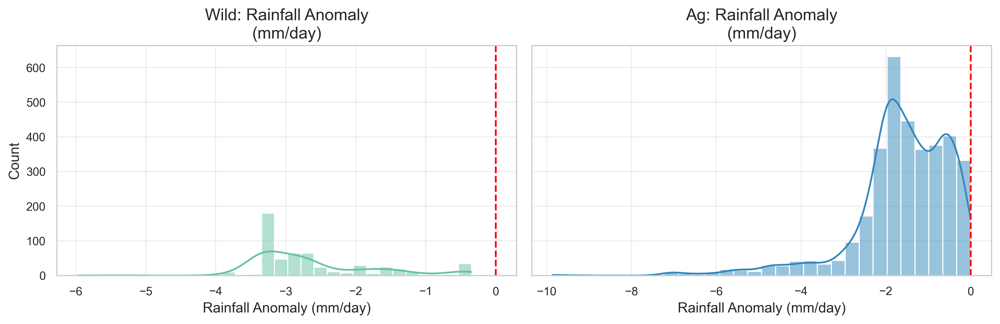

In [28]:
# 1) Convert everything to mm/day
df["contemp_precip_mm_day"] = df["contemp_precip"] * 1000  # m d⁻¹ → mm d⁻¹
df["monthly_precip_mm_day"] = df["monthly_precip"] / 30.0  # mm month⁻¹ → mm d⁻¹
df["annual_precip_mm_day"] = df["annual_precip"] / 365.0  # mm yr⁻¹   → mm d⁻¹

# 2) Compute the anomaly in mm/day
df["rain_anomaly_mm_day"] = df["contemp_precip_mm_day"] - df["monthly_precip_mm_day"]

# 3) A quick histogram to check the new distribution:

# Two‐panel histogram of rainfall anomaly
fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
sns.histplot(
    wild_df["rain_anomaly_daily"], bins=30, kde=True, color=WILD_COLOR, ax=axes[0]
)
axes[0].axvline(0, color="red", linestyle="--")
axes[0].set_title("Wild: Rainfall Anomaly\n(mm/day)")
axes[0].set_xlabel("Rainfall Anomaly (mm/day)")
axes[0].set_ylabel("Count")

sns.histplot(ag_df["rain_anomaly_daily"], bins=30, kde=True, color=AG_COLOR, ax=axes[1])
axes[1].axvline(0, color="red", linestyle="--")
axes[1].set_title("Ag: Rainfall Anomaly\n(mm/day)")
axes[1].set_xlabel("Rainfall Anomaly (mm/day)")
axes[1].set_ylabel("")  # already on left

plt.tight_layout()
plt.show()


Simple linear regression model

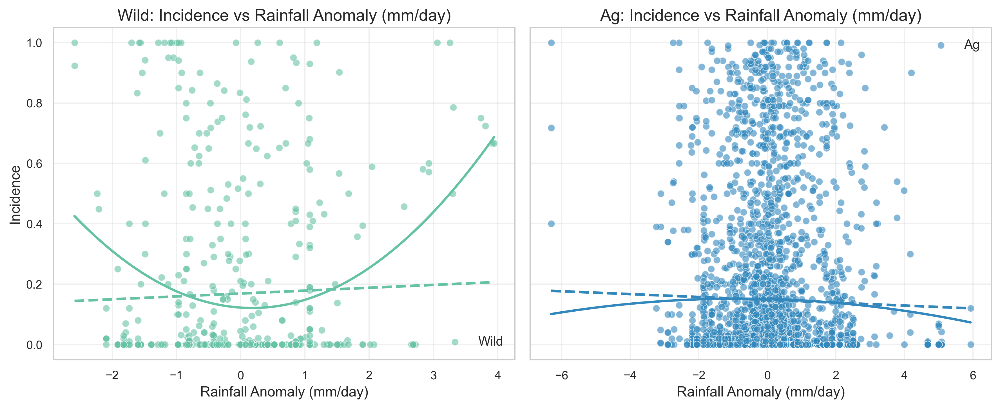

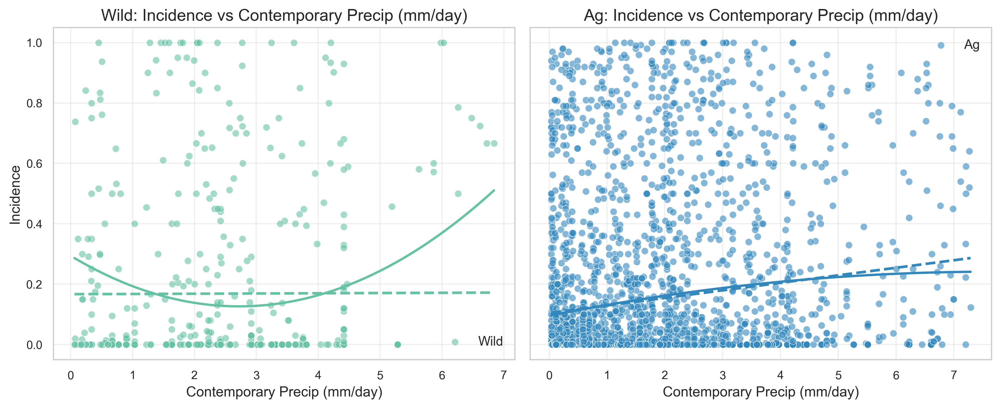

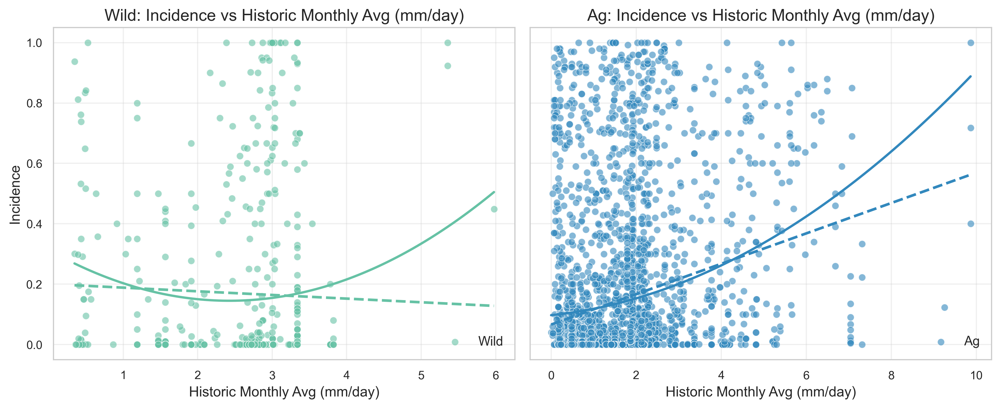

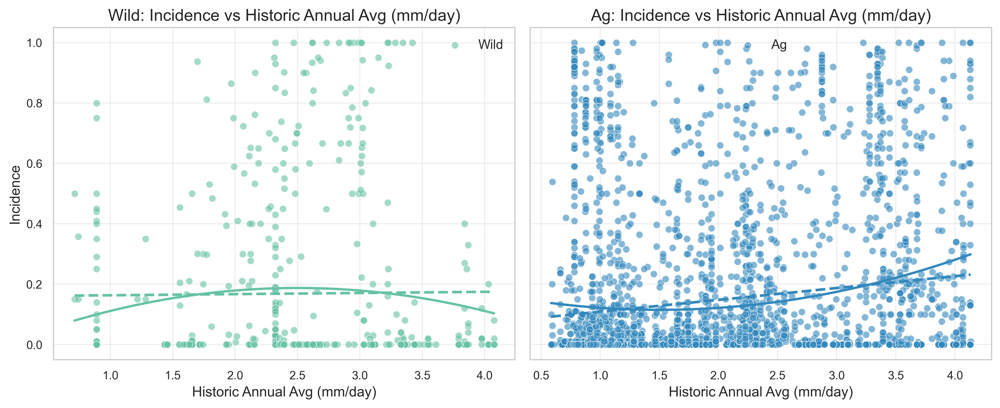

In [29]:
import warnings

wild_df = df[df["system_type"] == "Natural"]
ag_df = df[df["system_type"] == "Ag"]

# 3) Define the four rainfall‐based predictors and their axis labels
rainfall_vars = [
    ("rain_anomaly_mm_day", "Rainfall Anomaly (mm/day)"),
    ("contemp_precip_mm_day", "Contemporary Precip (mm/day)"),
    ("monthly_precip_mm_day", "Historic Monthly Avg (mm/day)"),
    ("annual_precip_mm_day", "Historic Annual Avg (mm/day)"),
]

# 4) Loop and plot
for xcol, xlabel in rainfall_vars:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
    for ax, (subdf, color, label) in zip(
        axes, [(wild_df, WILD_COLOR, "Wild"), (ag_df, AG_COLOR, "Ag")]
    ):
        # scatter
        sns.scatterplot(
            data=subdf,
            x=xcol,
            y="incidence",
            color=color,
            alpha=0.6,
            ax=ax,
            label=label,
        )
        # simple linear fit (order=1, dashed)
        sns.regplot(
            data=subdf,
            x=xcol,
            y="incidence",
            scatter=False,
            order=1,
            ci=None,
            line_kws={"linestyle": "--", "label": f"{label} linear"},
            color=color,
            ax=ax,
        )
        # quadratic fit (order=2, solid)
        sns.regplot(
            data=subdf,
            x=xcol,
            y="incidence",
            scatter=False,
            order=2,
            ci=None,
            line_kws={"linewidth": 2, "label": f"{label} quad"},
            color=color,
            ax=ax,
        )

        handles, labels = ax.get_legend_handles_labels()
        if labels:  # only if there’s at least one label
            ax.legend(handles, labels)

        ax.set_title(f"{label}: Incidence vs {xlabel}")
        ax.set_xlabel(xlabel)
        ax.set_ylabel("Incidence")
        ax.legend()

    plt.tight_layout()
    plt.show()

In [30]:
# Step 3: Build summary table of R², Adj-R², p(linear), p(quadratic) for rainfall models

import statsmodels.api as sm

# 1) Define your four rainfall predictors and human‐readable labels
rain_preds = [
    ("Rainfall Anomaly", "rain_anomaly_daily"),
    ("Contemporary Precipitation", "contemp_precip_mm_day"),
    ("Monthly Historical Rain", "monthly_precip_mm_day"),
    ("Annual Precipitation", "annual_precip_mm_day"),
]

# 2) Subset data for each system
wild_df = df[df["system_type"] == "Natural"]
ag_df = df[df["system_type"] == "Ag"]

# 3) Fit all six models and collect stats
rows = []
for label, col in rain_preds:
    for sys_label, subdf in [("Wild", wild_df), ("Ag", ag_df)]:
        # design matrix with x1 and x2
        X = pd.DataFrame(
            {
                "const": 1.0,
                "x1": subdf[col],
                "x2": subdf[col] ** 2,
            }
        )
        y = subdf["incidence"]
        m = sm.OLS(y, X).fit()
        rows.append(
            {
                "Relationship": f"{sys_label} • {label}",
                "R²": m.rsquared,
                "Adj. R²": m.rsquared_adj,
                "p (linear term)": m.pvalues["x1"],
                "p (quad term)": m.pvalues["x2"],
            }
        )

summary_precip = pd.DataFrame(rows)

# 4) Pretty‐print
pd.set_option("display.precision", 4)
summary_precip.style.format(
    {
        "R²": "{:.4f}",
        "Adj. R²": "{:.4f}",
        "p (linear term)": "{:.2e}",
        "p (quad term)": "{:.2e}",
    }
)


,Relationship,R²,Adj. R²,p (linear term),p (quad term)
0,Wild • Rainfall Anomaly,0.0134,0.0098,6.65e-03,1.01e-02
1,Ag • Rainfall Anomaly,0.0590,0.0585,8.53e-02,3.78e-06
2,Wild • Contemporary Precipitation,0.0365,0.0329,2.00e-05,6.41e-06
3,Ag • Contemporary Precipitation,0.0242,0.0237,7.49e-07,6.80e-02
4,Wild • Monthly Historical Rain,0.0134,0.0098,6.67e-03,1.01e-02
5,Ag • Monthly Historical Rain,0.0590,0.0585,8.61e-02,3.71e-06
6,Wild • Annual Precipitation,0.0089,0.0053,2.81e-02,2.79e-02
7,Ag • Annual Precipitation,0.0313,0.0307,2.95e-04,3.88e-08


<style>
.hypothesis-block {
    background: #222;
    color: #fff;
    border-radius: 8px;
    padding: 18px 20px 16px 20px;
    margin-bottom: 1.5em;
    box-shadow: 0 2px 8px rgba(0,0,0,0.08);
}
.hypothesis-title {
    color: #4E9A06;
    font-weight: bold;
    font-size: 1.15em;
    margin-bottom: 0.5em;
    display: block;
}
</style>

<h2>Overall Conclusion for Hypothesis 1</h2>

<div class="hypothesis-block">
    <span class="hypothesis-title">Key Takeaways:</span>
    <ol>
        <li>
            <b>All six temperature models explain non-trivial variance (R² up to ~0.11 in wild), with strong nonlinear (quad) effects in wild.
        </li>
        <li>
            <b>Precipitation models explain much less (R² ≤ 0.04 in wild, 0.06 in ag), and generally weaker than temperature.
        </li>
        <li>
            <b>Conclusion:</b> Weather (current), anomalies, and historical climate all significantly predict disease prevalence — especially temperature in wild systems.
        </li>
    </ol>
</div>


In [31]:
from IPython.display import HTML, display

# Turn each into HTML tables without their index column
html_temp = summary_temp.to_html(
    index=False, table_id="temp", classes="table table-striped"
)
html_rain = summary_precip.to_html(
    index=False, table_id="rain", classes="table table-striped"
)

# Wrap them in a flex container
html = f"""
<div style="display:flex; gap:40px; align-items:flex-start;">
  <div>
    <h3>Temperature</h3>
    {html_temp}
  </div>
  <div>
    <h3>Rainfall</h3>
    {html_rain}
  </div>
</div>
"""

display(HTML(html))


**Temperature metrics:**
- Wild systems: temperature metrics explain substantially more variance (up to ~11.5%) than in Ag (max ~7.0%), especially historical climate.

- Anomalies: in wild, anomalies have a strong linear effect but only weak/no nonlinear (quadratic) shaping.

- Conclusion: Temperature effects are indeed stronger in wild than in agricultural systems, supporting Hypothesis 1 for temperature.

**Rainfall metrics:**

- Wild vs Ag: rainfall metrics explain only tiny shares of variance in wild (~1–3.6%), whereas some Ag fits (anomaly & monthly) reach ~~5.9%.

- Anomalies have a weak nonlinear signal in wild but a strong quadratic‐only signal in agricultural.

- Conclusion: Rainfall effects are weaker in wild than in agricultural systems—opposite to what we saw for temperature.

<style>
.hypothesis-block {
    background: #222;
    color: #fff;
    border-radius: 8px;
    padding: 18px 20px 16px 20px;
    margin-bottom: 1.5em;
    box-shadow: 0 2px 8px rgba(0,0,0,0.08);
}
.hypothesis-block h2.hypothesis-title {
    color: #4E9A06;
    font-weight: bold;
    font-size: 1.15em;
    margin-bottom: 0.5em;
    /* you can add display:block here but <h2> is block by default */
}
</style>

<div class="hypothesis-block">
  <h2 class="hypothesis-title">Hypothesis 2: System-Type Sensitivity – Wild vs. Agricultural</h2>
  <b>Technical Statement:</b><br>
  <span style="color:#66c2a5;">Wild</span> plant–pathogen systems exhibit stronger responses to weather, anomalies, and historical climate than do <span style="color:#3288bd;">agricultural</span> systems, owing to local adaptation in the wild versus management (irrigation, pesticides, breeding) in crops.<br><br>
  <b>Plain-Language Version:</b><br>
  Because <span style="color:#66c2a5;">wild</span> plants grow without human intervention, disease in wild populations is more sensitive to changes in weather and climate. Crops—being watered, sprayed, and selectively bred—do not respond as dramatically.
</div>


In [32]:
# —————————————————————————————————————————————————————
# 1) Take existing summaries and split “System • Metric”
# —————————————————————————————————————————————————————
temp = summary_temp.copy()
# remove any stray spaces in the System names
temp[["System","Metric"]] = (
    temp.Relationship
        .str.split(" • ", expand=True)
)
temp["System"] = temp["System"].str.strip()
# standardize names:
temp['Metric'] = (temp['Metric']
                    .replace({'Anomaly':'Anomaly',
                              'Contemp':'Contemporary',
                              'Historical':'Annual Historical'}))


precip = summary_precip.copy()
precip[["System","Metric"]] = precip.Relationship.str.split(" • ", expand=True)
precip["System"] = precip["System"].str.strip()
precip['Metric'] = (precip['Metric']
                     .replace({'Rainfall Anomaly':'Anomaly',
                               'Contemporary Precipitation':'Contemporary',
                               'Monthly Historical Rain':'Monthly Historical',
                               'Annual Precipitation':'Annual Historical'}))


# —————————————————————————————————————————————————————
# 2) Pivot each into Wild & Ag R² columns
# —————————————————————————————————————————————————————
temp_pivot = (temp
    .pivot(index='Metric', columns='System', values='R²')
    .rename(columns={'Wild':'Temp_Wild_R2','Ag':'Temp_Ag_R2'})
    .reset_index()
    .assign(Type='Temp')
)

precip_pivot = (precip
    .pivot(index='Metric', columns='System', values='R²')
    .rename(columns={'Wild':'Rain_Wild_R2','Ag':'Rain_Ag_R2'})
    .reset_index()
    .assign(Type='Rain')
)

# —————————————————————————————————————————————————————
# 3) Concatenate them side by side
# —————————————————————————————————————————————————————
comp = pd.concat([temp_pivot, precip_pivot], ignore_index=True)

# —————————————————————————————————————————————————————
# 4) Compute “Wild > Ag?” flags
# —————————————————————————————————————————————————————
def flag(w, a, tol=0.01):
    if pd.isna(w) or pd.isna(a):
        return ''            # blank for missing
    if w > a:
        return 'slightly' if (w - a) < tol else 'yes'
    else:
        return 'no'

comp['Wild > Ag?'] = comp.apply(
    lambda r: flag(r[f'{r.Type}_Wild_R2'], r[f'{r.Type}_Ag_R2']),
    axis=1
)
# —————————————————————————————————————————————————————
# 5) Round & display as one HTML table
# —————————————————————————————————————————————————————
comp = comp[
    ['Type','Metric',
     'Temp_Wild_R2','Temp_Ag_R2',
     'Rain_Wild_R2','Rain_Ag_R2',
     'Wild > Ag?']
]

# pretty HTML
display(HTML(comp.to_html(
    index=False,
    float_format='%.4f',
    classes='table table-striped table-condensed',
    border=0
)))

System,Type,Metric,Temp_Wild_R2,Temp_Ag_R2,Rain_Wild_R2,Rain_Ag_R2,Wild > Ag?
,Temp,Annual Historical,0.1153,0.0359,NaN,NaN,yes
,Temp,Anomaly,0.0687,0.0071,NaN,NaN,yes
,Temp,Contemporary,0.0740,0.0698,NaN,NaN,slightly
,Rain,Annual Historical,NaN,NaN,0.0089,0.0313,no
,Rain,Anomaly,NaN,NaN,0.0134,0.0590,no
,Rain,Contemporary,NaN,NaN,0.0365,0.0242,yes
,Rain,Monthly Historical,NaN,NaN,0.0134,0.0590,no


1. **Temperature:**

- Wild systems consistently show higher R² than agricultural for all three temperature metrics (anomaly, contemporaneous, historical).

- Conclusion: Wild plant–pathogen systems are indeed more sensitive to temperature effects, validating Hypothesis 2 for temperature.

2. **Rainfall:**

- Only contemporary precipitation yields a slightly higher Wild R² (3.65% vs 2.42%).

- Anomalies and historical rainfall metrics are stronger in agricultural systems.

- Conclusion: Hypothesis 2 is not upheld for precipitation—rainfall-driven disease variation does not show uniformly greater sensitivity in wild systems.

<style>
.hypothesis-block {
    background: #222;
    color: #fff;
    border-radius: 8px;
    padding: 18px 20px 16px 20px;
    margin-bottom: 1.5em;
    box-shadow: 0 2px 8px rgba(0,0,0,0.08);
}
.hypothesis-title {
    color: #4E9A06;
    font-weight: bold;
    font-size: 1.15em;
    margin-bottom: 0.5em;
    display: block;
}
</style>

<h2>Overall Conclusion for Hypothesis 2</h2>

<div class="hypothesis-block">
    <span class="hypothesis-title">Summary</span>
Hypothesis 2 is strongly supported for temperature-driven disease responses (wild > agricultural), but fails for most precipitation-driven responses. Wild populations are indeed more climate-sensitive when it comes to heat and cold anomalies, whereas rainfall effects are more system-specific and in some cases even buffered in wild settings.
</div>


<style>
.hypothesis-block {
    background: #222;
    color: #fff;
    border-radius: 8px;
    padding: 18px 20px 16px 20px;
    margin-bottom: 1.5em;
    box-shadow: 0 2px 8px rgba(0,0,0,0.08);
}
.hypothesis-block h2.hypothesis-title {
    color: #4E9A06;
    font-weight: bold;
    font-size: 1.15em;
    margin-bottom: 0.5em;
    display: block;
}
</style>

<div class="hypothesis-block">
    <h2 class="hypothesis-title">Hypothesis 3: Thermal & Precipitation Mismatch Effects</h2> 
    In <span style="color:#66c2a5;">wild</span> systems, disease prevalence peaks when weather deviates from historical norms (e.g., unusually warm in a cool climate or vice versa)—a “mismatch” effect. In contrast, <span style="color:#3288bd;">agricultural</span> systems show little or no such mismatch, because management buffers extremes.<br>
    <b>Plain-Language Version:</b><br>
    <span style="color:#66c2a5;">Wild</span> plants get sicker when today’s weather is very different from what they are used to (e.g., a cool-climate wild plant suffers in a sudden heatwave). On farms, growers prevent those extremes, so crop diseases do not spike in the same way.
</div>

### Anomaly Ranges

Let's review again the anomaly distributions for both temperature and rainfall

First I would extract subplots (a) and (d) that show the incidence distribution vs temperature anomaly across both system types

In [33]:
from PIL import Image

# 1. Load the full figure
fig = Image.open('../images/anomaly_temp_incidence.png')

# 2. Compute grid geometry
cols, rows = 3, 2
w, h = fig.size
sub_w, sub_h = w/cols, h/rows

def crop_subplot(col: int, row: int) -> Image.Image:
    """
    Crop out the subplot at (col, row), 0-indexed.
    col=0..2, row=0..1
    """
    left   = int(col * sub_w)
    upper  = int(row * sub_h)
    right  = int((col + 1) * sub_w)
    lower  = int((row + 1) * sub_h)
    return fig.crop((left, upper, right, lower))

# 3. Extract panels (a) and (d)
panel_a = crop_subplot(col=0, row=0)   # (a) is top-left
panel_d = crop_subplot(col=0, row=1)   # (d) is bottom-left

# 4. Ensure output directory exists
outdir = '../images'
os.makedirs(outdir, exist_ok=True)

# 5. Save as RGB‐JPEG
panel_a.convert('RGB').save(f'{outdir}/anomaly_wild_panel_a.jpg', quality=120)
panel_d.convert('RGB').save(f'{outdir}/anomaly_ag_panel_d.jpg',  quality=120)


#### 1. Anomaly Distributions  
_Distribution of monthly temperature deviations (°C) from historical means, Wild vs. Ag systems._  
![Temperature Anomaly Distribution (Wild & Ag)](../images/anomaly_hist_temp.png)


#### 2. Rainfall Anomaly Distributions  
_Distribution of monthly rainfall deviations (mm/day) from historical means, Wild vs. Ag systems._  
![Rainfall Anomaly Distribution (Wild & Ag)](../images/anomaly_hist_rain.png)


The two histograms show how far each system’s monthly weather departs from its long-term mean:

- **Temperature anomalies** span roughly –7.3 °C (much colder than normal) up to +7.8 °C (much warmer). Both Wild and Ag observations cluster tightly around zero, but Wild sites exhibit a slightly broader tail into cold anomalies, reflecting surveys conducted across a wider climatic gradient.  
  
- **Rainfall anomalies** are exclusively ≤ 0 mm/day, meaning our disease surveys only sampled months drier than their historical averages (no unusually wet months). Note how Ag sites pile up closer to zero (milder drought), while Wild sites are more evenly spread across moderate (–5 mm/day) to severe (–9 mm/day) deficits.  


### Quadratic Fits


#### 1. Incidence vs Temperature Anomaly  
_Scatterplots with quadratic smoothing showing disease incidence as a function of raw temperature anomaly._  
- **(a) Wild systems**  
  ![Panel (a) Incidence vs Temp Anomaly (Wild)](../images/anomaly_wild_panel_a.jpg)  
- **(d) Agricultural systems**  
  ![Panel (d) Incidence vs Temp Anomaly (Ag)](../images/anomaly_ag_panel_d.jpg)


#### 2. Incidence vs Rainfall Anomaly  
_Disease incidence vs. daily rainfall anomaly (mm/day) with quadratic fits for Wild and Ag._  
![Incidence vs Rainfall Anomaly (Wild & Ag)](../images/anomaly_rain_incidence.png)

The two quadratic‐fit panels above relate disease incidence to raw anomaly magnitude. The table distills their key shapes:

| System  | Temperature (°C)                                                           | Rainfall (mm/day)                                           |
|:-------:|:--------------------------------------------------------------------------|:------------------------------------------------------------|
| **Wild**  | U-shape: lowest incidence at 0 °C anomaly, peaks around +2–3 °C and again at <–2 °C.  | U-shape: highest incidence near –1 mm/day, dips around –5 mm/day, then rises again by –9 mm/day. |
| **Ag**    | Monotonic rise to +2 °C then plateau; only a faint uptick at cold extremes. | Much shallower U-shape under drought—incidence barely increases even at severe deficits.  |

### Summary of Findings

- **Wild systems** display a clear U-shaped “mismatch” response: disease is minimal when weather is near normal, but spikes under both warmer and colder extremes (temperature) or mild and severe drought (rainfall).  
- **Ag systems** show only a slight increase in incidence with warming or drying, reflecting management buffering.


### Interaction Effects

In [34]:
# --- Wild Systems ---

# Temperature mismatch interaction
wild_temp_model = smf.ols(
    formula='incidence ~ temp_anomaly_C * monthly_temp_C',
    data=wild_df
).fit()
print("Wild – Temperature Interaction")
print(wild_temp_model.summary().tables[1])

# Rainfall mismatch interaction
wild_rain_model = smf.ols(
    formula='incidence ~ rain_anomaly_daily * monthly_precip_mm_per_day',
    data=wild_df
).fit()
print("\nWild – Rainfall Interaction")
print(wild_rain_model.summary().tables[1])


Wild – Temperature Interaction
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                         0.4822      0.058      8.303      0.000       0.368       0.596
temp_anomaly_C                    0.2888      0.034      8.556      0.000       0.222       0.355
monthly_temp_C                   -0.0174      0.003     -5.918      0.000      -0.023      -0.012
temp_anomaly_C:monthly_temp_C    -0.0142      0.002     -7.673      0.000      -0.018      -0.011

Wild – Rainfall Interaction
                                                   coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------
Intercept                                        0.3213      0.058      5.508      0.000       0.207       0.436
rain_anomaly_

**Wild Systems**

- **Temperature interaction** (temp_anomaly_C:monthly_temp_C = –0.0142, p < 0.001):

  - A clear negative interaction: at cooler historical sites, warming anomalies drive a large increase in incidence, while at warmer sites, cooling anomalies likewise boost disease.

  - This U-shaped “mismatch” (disease peaks when current temperature deviates from the local norm in either direction) is textbook thermal mismatch.

- **Rainfall interaction** (rain_anomaly_daily:monthly_precip_mm_per_day = –0.0312, p = 0.006):

  - Negative interaction means that in historically wetter regions, drought anomalies produce a larger spike in incidence; in drier regions (where our data only include deficits), even slight relief (less drought) would have driven disease up if observed.

  - Again, disease peaks under mismatch between current moisture and the long‐term regime.

In [35]:
# --- Agricultural Systems ---

# Temperature mismatch interaction
ag_temp_model = smf.ols(
    formula='incidence ~ temp_anomaly_C * monthly_temp_C',
    data=ag_df
).fit()
print("\nAg – Temperature Interaction")
print(ag_temp_model.summary().tables[1])

# Rainfall mismatch interaction
ag_rain_model = smf.ols(
    formula='incidence ~ rain_anomaly_daily * monthly_precip_mm_per_day',
    data=ag_df
).fit()
print("\nAg – Rainfall Interaction")
print(ag_rain_model.summary().tables[1])


Ag – Temperature Interaction
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                        -0.2002      0.025     -8.127      0.000      -0.248      -0.152
temp_anomaly_C                    0.0538      0.014      3.782      0.000       0.026       0.082
monthly_temp_C                    0.0192      0.001     14.559      0.000       0.017       0.022
temp_anomaly_C:monthly_temp_C    -0.0031      0.001     -3.956      0.000      -0.005      -0.002

Ag – Rainfall Interaction
                                                   coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------
Intercept                                        0.0952      0.010      9.640      0.000       0.076       0.115
rain_anomaly_dai

**Agricultural Systems**

- **Temperature interaction** (temp_anomaly_C:monthly_temp_C = –0.0031, p < 0.001):

  Still significant but ~5× smaller than in Wild. Crops show a muted mismatch response—warming/cooling extremes modestly affect incidence.

- **Rainfall interaction** (rain_anomaly_daily:monthly_precip_mm_per_day = –0.0069, p < 0.001):

  Also significant but much weaker than Wild. Management (irrigation, variety selection) buffers most of the drought‐driven spikes.

<style>
.hypothesis-block {
    background: #222;
    color: #fff;
    border-radius: 8px;
    padding: 18px 20px 16px 20px;
    margin-bottom: 1.5em;
    box-shadow: 0 2px 8px rgba(0,0,0,0.08);
}
.hypothesis-title {
    color: #4E9A06;
    font-weight: bold;
    font-size: 1.15em;
    margin-bottom: 0.5em;
    display: block;
}
</style>

<div class="hypothesis-block">
    <h2 class="hypothesis-title">Overall Conclusion for Hypothesis 3</h2>

- **Wild plant–pathogen systems** exhibit strong thermal and precipitation mismatch: disease incidence climbs markedly whenever current weather departs from historical normals, whether hotter, colder, drier, or (hypothetically) wetter.

- **Agricultural systems** show only a faint mismatch signature—extreme anomalies drive only small changes in disease—indicating that human management substantially dampens climate‐driven disease peaks.

**These results strongly support Hypothesis 3: mismatch effects dominate in wild systems and are largely buffered in crops.**

<style>
.hypothesis-block {
    background: #222;
    color: #fff;
    border-radius: 8px;
    padding: 18px 20px 16px 20px;
    margin-bottom: 1.5em;
    box-shadow: 0 2px 8px rgba(0,0,0,0.08);
}
.hypothesis-block h2.hypothesis-title {
    color: #4E9A06;
    font-weight: bold;
    font-size: 1.15em;
    margin-bottom: 0.5em;
    display: block;
}
</style>

<div class="hypothesis-block">
    <h2 class="hypothesis-title">Hypothesis 4: Geographic & Pathogen-Type Modulation of Climate–Disease Links</h2>
    <b>Technical Statement:</b><br>
    Geographic variation in the identity and thermal/moisture tolerances of pathogens (fungi vs. bacteria vs. viruses vs. nematodes, etc.) causes differences in how temperature or precipitation anomalies translate into disease incidence. Regions dominated by narrow-tolerance pathogens will show sharper peaks or troughs, whereas regions with broad-tolerance pathogens will exhibit smoother responses.<br>
    <b>Plain-Language Version:</b><br>
    Different diseases (e.g., a fungus vs. a virus) have their own “ideal” temperature and moisture ranges. As a result, disease risk will not only depend on local climate but also on which pathogen is present. For example, a rain-loving fungus might explode in a wet, cool mountain valley but be essentially absent on a hot, dry plains region—even if the two sites experience the same size temperature spike.
</div>

To begin with the validation of Hypothesis 4, we start with Data Preparation

### Data Preparation

#### 1. Ensure pathogen type is categorical

In [36]:
# Show unique entries and counts for each candidate column
print("=== Antagonist_type_general ===")
print(df['Antagonist_type_general'].value_counts(dropna=False))

=== Antagonist_type_general ===
Antagonist_type_general
Virus                  2669
Eukaryotic parasite    1123
Pest                    159
Bacteria                 89
Name: count, dtype: int64


In [37]:
df['Antagonist_type_general'] = df['Antagonist_type_general'].astype('category')

#### 2. We have already computed absolute anomalies in the previous sections, so we can use those directly. We show it here again for clarity.

In [38]:
df['abs_temp_anom']   = (df['monthly_temp_C']   - df['contemp_temp_C']).abs()
df['abs_precip_anom'] = (df['monthly_precip_mm_per_day'] - df['contemp_precip_mm_day']).abs()

### 2. Exploratory Coverage
#### 2.1. Pathogen & Host‐Order Counts

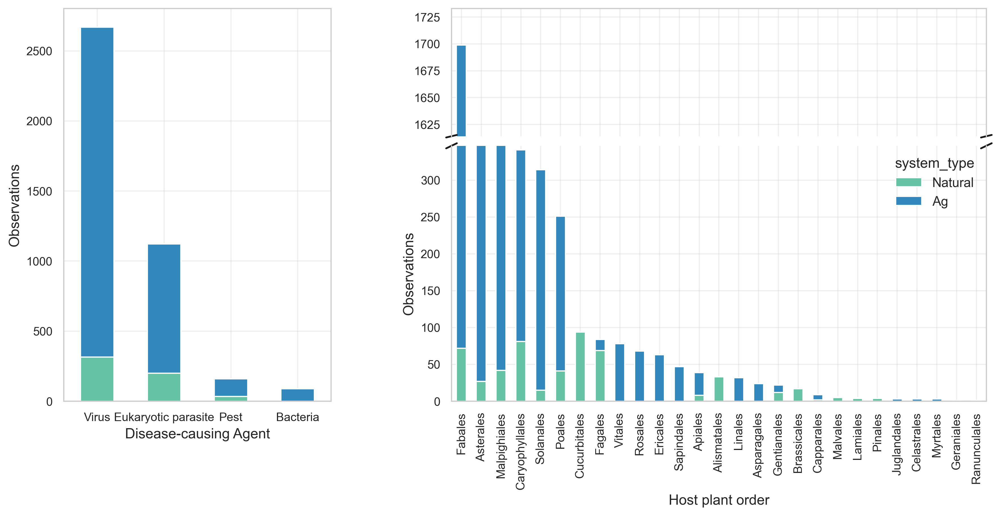

In [78]:
import matplotlib.gridspec as gridspec

# 1) Prepare counts
agent_counts = (
    df
    .groupby(['Antagonist_type_general','system_type'], observed= True)
    .size()
    .unstack(fill_value=0)
    .loc[['Virus','Eukaryotic parasite','Pest','Bacteria']]
)

host_counts = (
    df[df['Host_order'] != 'Unknown']  # drop Unknown
      .groupby(['Host_order','system_type'])
      .size()
      .unstack(fill_value=0)
      .loc[df['Host_order'].value_counts().drop('Unknown').index]
)

# 2) Set up figure with GridSpec: 1 row, 2 cols
fig = plt.figure(figsize=(14, 6))
gs = gridspec.GridSpec(1, 2, width_ratios=[1,2], wspace=0.3)

# --- Panel (a) on the left ---
ax0 = fig.add_subplot(gs[0])
agent_counts[['Natural','Ag']].plot(
    kind='bar', stacked=True,
    color=[WILD_COLOR, AG_COLOR],
    ax=ax0, legend=False
)

ax0.set_xlabel('Disease-causing Agent')
ax0.set_ylabel('Observations')
ax0.set_xticklabels(agent_counts.index, rotation=0)

# --- Panel (b) on the right with broken y-axis ---
# Create a 2×1 sub-grid in the second column
inner_gs = gs[1].subgridspec(2, 1, height_ratios=[1, 2], hspace=0.05)

ax1 = fig.add_subplot(inner_gs[0])  # top
ax2 = fig.add_subplot(inner_gs[1], sharex=ax1)  # bottom

# Top: focus on the highest bar(s)
host_counts[['Natural','Ag']].plot(
    kind='bar', stacked=True,
    color=[WILD_COLOR, AG_COLOR],
    ax=ax1, legend=False
)
ax1.set_ylim(host_counts.sum(axis=1).max() * 0.95,
             host_counts.sum(axis=1).max() * 1.02)
ax1.spines['bottom'].set_visible(False)
ax1.tick_params(labelbottom=False)  # hide x labels here
ax1.set_ylabel('')

# Bottom: the remainder
host_counts[['Natural','Ag']].plot(
    kind='bar', stacked=True,
    color=[WILD_COLOR, AG_COLOR],
    ax=ax2, legend=False
)
ax2.set_ylim(0, host_counts.sum(axis=1).quantile(0.90))
ax2.spines['top'].set_visible(False)
ax2.set_xlabel('Host plant order')
ax2.set_ylabel('Observations')

# Add small slashes to denote broken axis
d = .01  # proportion of axis
for ax in (ax1, ax2):
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    if ax is ax1:
        ax.plot((-d, +d), (-d, +d), **kwargs)
        ax.plot((1-d,1+d),(-d,+d), **kwargs)
    else:
        ax.plot((-d, +d),(1-d,1+d), **kwargs)
        ax.plot((1-d,1+d),(1-d,1+d), **kwargs)

# Legend on bottom panel
ax2.legend(title='system_type', loc='upper right')

# plt.savefig('../images/hyp4_agent_host.png', dpi=300)
plt.show()

#### 2.2. Geographic Spread of Surveys

In [59]:

import plotly.graph_objects as go
import plotly.io as pio

# 1) Make sure you have the System column
df["System"] = df["system_type"].map({"Ag":"Agricultural","Natural":"Wild"})


fig = go.Figure()

# Add one trace per system
for system, symbol in [("Agricultural","circle"),("Wild","diamond")]:
    df_sub = df[df["System"]==system]
    fig.add_trace(go.Scattergeo(
        lon = df_sub["Longitude"],
        lat = df_sub["Latitude"],
        mode = "markers",
        name = system,
        marker = dict(
            symbol = symbol,
            size   = 8,
            line   = dict(width=0.5, color="black"),
            color  = df_sub["contemp_temp_C"],
            coloraxis="coloraxis",   
            colorscale = "Inferno",
            colorbar = dict(
                title      = "Temp (°C)",
                tickformat = ".0f",
                x          = -0.12,    # left of map
                y          = 0.5,
                yanchor    = "middle",
                len        = 0.6,
                thickness  = 15,
                outlinecolor = "black"
            ),
        ),
        hovertemplate=(
            "<b>%{text}</b><br><br>"
            "Temp: %{marker.color:.1f} °C<br>"
            "Incidence: %{customdata[0]:.2f}<br>"
            "Year: %{customdata[1]}<br>"
            "Agent: %{customdata[2]}<br>"
            "Host order: %{customdata[3]}<extra></extra>"
        ),
        text = df_sub["System"],
        customdata = df_sub[[
            "calculated_incidence",
            "Study_Year",
            "Parasite_or_pest",
            "Host_order"
        ]].values
    ))
    
# 2) Configure the shared coloraxis (single bar)
fig.update_layout(
    coloraxis=dict(
        colorscale="Inferno",
        colorbar=dict(
            title="Temp (°C)",
            tickformat=".0f",
            x=0.02,   # move colorbar to left margin
            y=0.5,
            yanchor="middle",
            len=0.6,
            thickness=15,
            outlinecolor="black"
        )
    )
)
# 3) Update layout & projection
fig.update_geos(
    visible=False,
    showcountries=True, countrycolor="lightgray",
    showland=True, landcolor='whitesmoke'
)
fig.update_layout(
        legend=dict(
        title="System",
        x=0.02,      # far left
        y=0.98,      # top
        xanchor="left",
        yanchor="top",
        bgcolor="rgba(0,0,0,0)",
        font=dict(size=12)
    ),
    title=(
        "Global database of plant disease spanning geography, weather and climate<br>"
        "Circles = Agricultural, Diamonds = Wild (N=4339). color = mean temp (°C)."
    ),
    title_x=0.5,
    title_font_size=14,
    margin=dict(l=180, r=20, t=100, b=20),
    width=1000, height=600,
    template="plotly"
)


# 4) Show inline (Notebook mode)

pio.renderers.default = "notebook_connected"
fig.show()

# 3) Export to high-res PNG at ~300 dpi
#    width_inches = width_pixels / dpi → here: 1000px / 300dpi ≈ 3.33"
#    so scale=3 gives 3000px → 300dpi at ~10" wide
fig.write_image("../images/global_map.png", format="png", width=1000, height=600, scale=3)
print("Saved high-res PNG to images/global_map.png")


Saved high-res PNG to images/global_map.png


### 3. Define “Narrow” vs. “Broad” Tolerance

We’ll use a data-driven proxy: the 5th–95th percentile range of nonzero incidence anomalies per pathogen type.

In [61]:
def realized_breadth(df, species, col):
    x = df.loc[(df.Antagonist_type_general==species)&(df.incidence>0), col]
    return x.quantile(0.95) - x.quantile(0.05)

breadths = {s: realized_breadth(df, s, 'temp_anomaly_C') 
            for s in df.Antagonist_type_general.unique()}
b = pd.Series(breadths).sort_values()

# define bottom & top quartiles
narrow = b[b <= b.quantile(0.25)].index
broad  = b[b >= b.quantile(0.75)].index

df['tolerance_class'] = df['Antagonist_type_general'].map(
    lambda s: 'narrow' if s in narrow 
              else ('broad' if s in broad else 'intermediate')
)

### 4. Visualize Anomaly–Incidence by Group

#### 4.1. By Pathogen Type

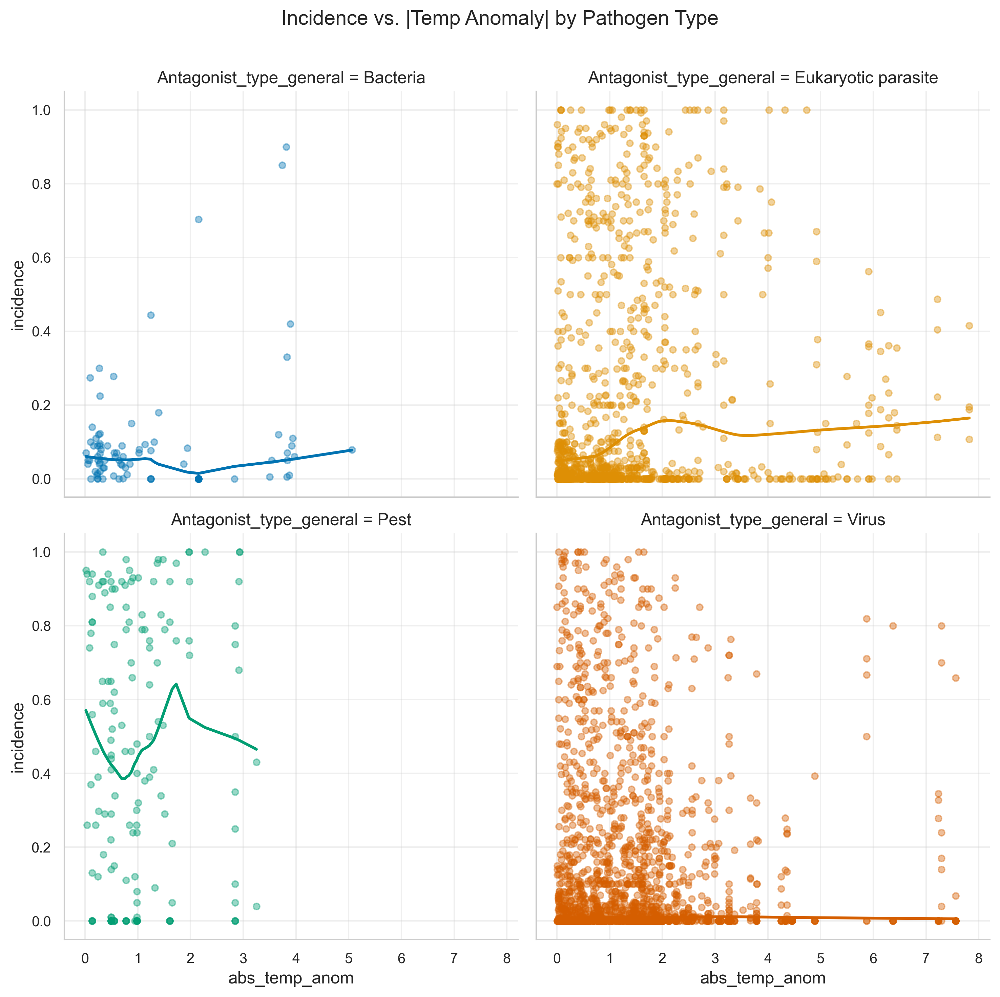

In [77]:
sns.lmplot(
    x='abs_temp_anom', y='incidence',
    hue='Antagonist_type_general', col='Antagonist_type_general',
    data=df, lowess=True, scatter_kws={'alpha':0.4,'s':20},
    line_kws={'linewidth':2}, col_wrap=2
)
plt.subplots_adjust(top=0.9)
plt.suptitle('Incidence vs. |Temp Anomaly| by Pathogen Type')
plt.savefig('../images/hyp4_temp_by_pathogen_type.png', dpi=300)


#### 4.2 By Tolerance Class

For Temperature Anomalies:

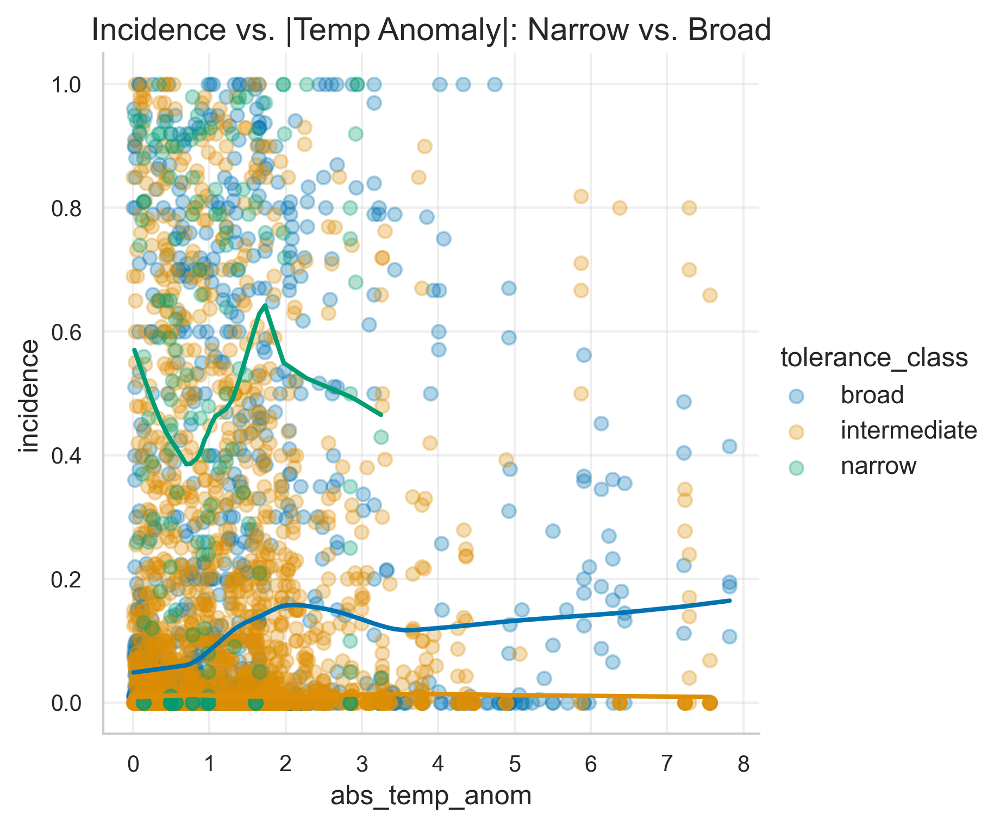

In [66]:
sns.lmplot(
    x='abs_temp_anom', y='incidence',
    hue='tolerance_class', data=df, lowess=True,
    scatter_kws={'alpha':0.3}, line_kws={'linewidth':2}
)
plt.title('Incidence vs. |Temp Anomaly|: Narrow vs. Broad')
plt.savefig('../images/hyp4_temp_by_tolerance.png', dpi=300)


For Precipitation anomalies:

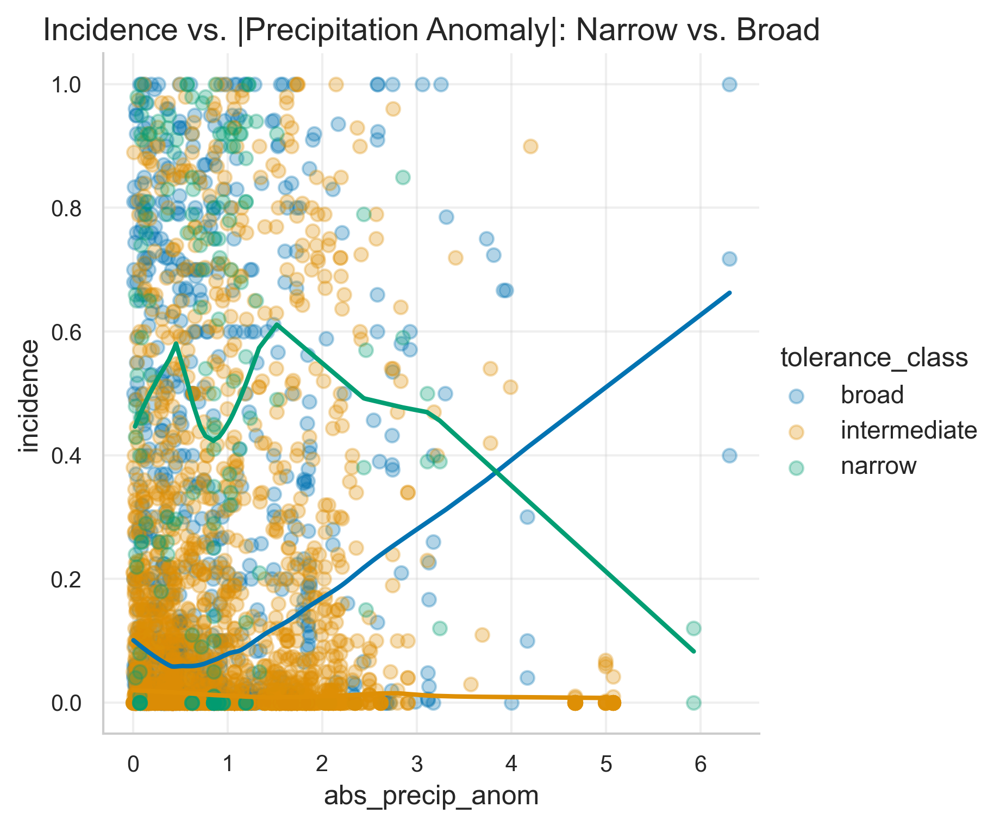

In [67]:
sns.lmplot(
    x='abs_precip_anom', y='incidence',
    hue='tolerance_class', data=df, lowess=True,
    scatter_kws={'alpha':0.3}, line_kws={'linewidth':2}
)
plt.title('Incidence vs. |Precipitation Anomaly|: Narrow vs. Broad')
plt.savefig('../images/hyp4_precip_by_tolerance.png', dpi=300)


### 5. Interaction Regression Tests

#### 5.1. Pathogen Type Interactions

In [68]:
import statsmodels.formula.api as smf

temp_type_model = smf.ols(
    'incidence ~ abs_temp_anom * C(Antagonist_type_general)',
    data=df
).fit()
print(temp_type_model.summary())

precip_type_model = smf.ols(
    'incidence ~ abs_precip_anom * C(Antagonist_type_general)',
    data=df
).fit()
print(precip_type_model.summary())


                            OLS Regression Results                            
Dep. Variable:              incidence   R-squared:                       0.096
Model:                            OLS   Adj. R-squared:                  0.094
Method:                 Least Squares   F-statistic:                     61.00
Date:                Tue, 10 Jun 2025   Prob (F-statistic):           1.17e-83
Time:                        10:32:43   Log-Likelihood:                -129.10
No. Observations:                4040   AIC:                             274.2
Df Residuals:                    4032   BIC:                             324.6
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                                                      coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

- None of the pathogen‐type interaction terms reach statistical significance (all p > 0.05).

- The (non‐significant) negative coefficient for viruses in the temp model (p≈0.10) hints at a slightly stronger mismatch, but this is weak evidence.

- Conclusion: Antagonist_type_general (Virus vs. Eukaryotic parasite vs. Pest vs. Bacteria) does not significantly alter the slope of incidence vs. anomaly.

#### 5.2 Tolerance-Class Interaction

In [69]:
temp_tol_model = smf.ols(
    'incidence ~ abs_temp_anom * C(tolerance_class)',
    data=df
).fit()
print(temp_tol_model.summary())

precip_tol_model = smf.ols(
    'incidence ~ abs_precip_anom * C(tolerance_class)',
    data=df
).fit()
print(precip_tol_model.summary())


                            OLS Regression Results                            
Dep. Variable:              incidence   R-squared:                       0.095
Model:                            OLS   Adj. R-squared:                  0.094
Method:                 Least Squares   F-statistic:                     84.81
Date:                Tue, 10 Jun 2025   Prob (F-statistic):           5.60e-85
Time:                        10:32:57   Log-Likelihood:                -130.53
No. Observations:                4040   AIC:                             273.1
Df Residuals:                    4034   BIC:                             310.9
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                                       coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------

- **Intermediate‐tolerance pathogens** show a significant negative interaction (coef = –0.0196, p = 0.003), indicating dampened mismatch sensitivity compared to the baseline (broad‐tolerance).

- **Narrow‐tolerance pathogens** do not differ significantly from broad‐tolerance (p = 0.85).

- **Conclusion:** Realized “breadth” matters more than taxonomic group: pathogens in the intermediate‐breadth class are less sensitive to anomaly deviations, but narrow‐ and broad‐tolerance classes behave similarly.

### Summary and Interpretation

In [73]:
def summarize_interactions(model, prefix):
    rows = []
    for term, coef in model.params.items():
        if prefix in term and ':' in term:
            p = model.pvalues[term]
            rows.append((term, coef, p))
    return pd.DataFrame(rows, columns=['term','coef','pvalue'])

temp_type_int  = summarize_interactions(temp_type_model, 'abs_temp_anom:C(Antagonist_type_general)')
precip_type_int = summarize_interactions(precip_type_model, 'abs_precip_anom:C(Antagonist_type_general)')

print("Temperature × Pathogen Type Interactions")
print(temp_type_int.to_markdown(index=False))

print("\nPrecipitation × Pathogen Type Interactions")
print(precip_type_int.to_markdown(index=False))


Temperature × Pathogen Type Interactions
| term                                                            |        coef |    pvalue |
|:----------------------------------------------------------------|------------:|----------:|
| abs_temp_anom:C(Antagonist_type_general)[T.Eukaryotic parasite] | -0.0124202  | 0.544997  |
| abs_temp_anom:C(Antagonist_type_general)[T.Pest]                | -0.00757083 | 0.811626  |
| abs_temp_anom:C(Antagonist_type_general)[T.Virus]               | -0.0335012  | 0.0989767 |

Precipitation × Pathogen Type Interactions
| term                                                              |       coef |   pvalue |
|:------------------------------------------------------------------|-----------:|---------:|
| abs_precip_anom:C(Antagonist_type_general)[T.Eukaryotic parasite] |  0.0363236 | 0.3523   |
| abs_precip_anom:C(Antagonist_type_general)[T.Pest]                | -0.0591725 | 0.178764 |
| abs_precip_anom:C(Antagonist_type_general)[T.Virus]               |

<style>
.hypothesis-block {
    background: #222;
    color: #fff;
    border-radius: 8px;
    padding: 18px 20px 16px 20px;
    margin-bottom: 1.5em;
    box-shadow: 0 2px 8px rgba(0,0,0,0.08);
}
.hypothesis-title {
    color: #4E9A06;
    font-weight: bold;
    font-size: 1.15em;
    margin-bottom: 0.5em;
    display: block;
}
</style>

<div class="hypothesis-block">
    <h2 class="hypothesis-title">Overall Conclusion for Hypothesis 4</h2>

- **Pathogen identity alone** (virus vs. bacteria vs. etc.) is not a strong modulator of climate–disease mismatch.

- **Climatic‐tolerance breadth** shows partial support: intermediate‐tolerance pathogens have significantly shallower anomaly–incidence slopes, but narrow‐tolerance pathogens *do not* exhibit the predictThus, 
- **Hypothesis 4 is only weakly supported**—tolerance class has some effect, but classic pathogen‐type differences (fungi vs. bacteria etc.) do not. We may need more granular tolerance metrics (e.g. cardinal temperatures) or larger sample sizes per group to detect stronger pathogen‐type modulation.

<style>
.hypothesis-block {
    background: #222;
    color: #fff;
    border-radius: 8px;
    padding: 18px 20px 16px 20px;
    margin-bottom: 1.5em;
    box-shadow: 0 2px 8px rgba(0,0,0,0.08);
}
.hypothesis-block h2.hypothesis-title {
    color: #4E9A06;
    font-weight: bold;
    font-size: 1.15em;
    margin-bottom: 0.5em;
    display: block;
}
</style>

<div class="hypothesis-block">
    <h2 class="hypothesis-title">Hypothesis 5: Transmission-Mode Sensitivity to Anomalies</h2>
    <b>Technical Statement:</b><br>
    Direct‐Transmission Sensitivity to Anomalies: Soil-borne or contact‐transmitted pathogens exhibit stronger sensitivity to precipitation anomalies than vector-borne pathogens, because these pathogens rely immediately on environmental moisture for survival, dispersal, and infection, whereas vector-borne pathogens benefit from the buffered microclimates or mobility provided by their animal vectors.<br>

</div>

In [81]:
df['Transmission_mode']

0       vectorborne and sexually-transmitted
1       vectorborne and sexually-transmitted
2       vectorborne and sexually-transmitted
4       vectorborne and sexually-transmitted
5       vectorborne and sexually-transmitted
                        ...                 
4927                             vectorborne
4928                             vectorborne
4929                             vectorborne
4930                             vectorborne
4931                             vectorborne
Name: Transmission_mode, Length: 4040, dtype: object

### Data Preparation

#### Define Transmission Mode

In [82]:
print(df['Transmission_mode'].value_counts(dropna=False))

Transmission_mode
vectorborne                             2609
Seedborne and vectorborne                408
Vectorborne                              250
Mechanical                               135
Seedborne                                112
vectorborne and sexually-transmitted      61
Windborne                                 50
Waterborne                                49
Water, airborne, vectorborne              46
seedborne                                 43
mechanical                                33
waterborne and windborne                  32
Waterborne and soilborne                  30
Soilborne                                 29
waterborne                                29
waterborne                                28
airborne                                  18
soilborne and seedborne                   18
Seedborne and pollenborne                 11
pollenborne                                9
Direct contact                             9
airborne/dropletborne                

### Classify transmission modes to either “vector-borne” or “direct” based on the `transmission_mode` column.
- **Vector-borne**: Diseases that require an insect or mite vector to spread (e.g., aphid-transmitted viruses, leafhoppers).
- **Direct**: Diseases that are transmitted directly between hosts (e.g., through contact, droplets).

In [84]:
# Normalize to lowercase
df['trans_mode_clean'] = (
    df['Transmission_mode']
      .str.strip()
      .str.lower()
)

# Classify
def classify_mode(x):
    return 'Vector-borne' if 'vector' in x else 'Direct'

df['transmission_mode_group'] = df['trans_mode_clean'].apply(classify_mode)

# Quick check
print(df['transmission_mode_group'].value_counts())

transmission_mode_group
Vector-borne    3374
Direct           666
Name: count, dtype: int64


In [85]:
# 2) Prepare Precipitation Anomaly
# we already have abs_precip_anom, so we could skip this. Otherwise:
df['abs_precip_anom'] = df['rain_anomaly_daily'].abs()

### Fit OLS regressions that interact precipitation anomalies with transmission mode

In [102]:
# 3) Fit OLS with interaction
import statsmodels.formula.api as smf
from patsy.contrasts import Treatment

# specify Direct as the reference level
model5 = smf.ols(
    formula='incidence ~ abs_precip_anom * C(transmission_mode_group,Treatment("Direct"))',
    data=df
).fit()

# Show just the coef table
print(model5.summary().tables[1])



                                                                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------------------------------------------
Intercept                                                                           0.1171      0.019      6.326      0.000       0.081       0.153
C(transmission_mode_group, Treatment("Direct"))[T.Vector-borne]                    -0.0414      0.020     -2.058      0.040      -0.081      -0.002
abs_precip_anom                                                                     0.0505      0.007      7.234      0.000       0.037       0.064
abs_precip_anom:C(transmission_mode_group, Treatment("Direct"))[T.Vector-borne]    -0.0150      0.008     -1.866      0.062      -0.031       0.001


For creating interpretation:

In [103]:
# 1) Define the rows you want, matching the terms in your model
rows = [
    ("Intercept (Direct slope)", 
     model5.params["Intercept"], 
     model5.pvalues["Intercept"]),
    
    ("Vector-borne main effect (offset at zero anomaly)", 
     model5.params['C(transmission_mode_group, Treatment("Direct"))[T.Vector-borne]'], 
     model5.pvalues['C(transmission_mode_group, Treatment("Direct"))[T.Vector-borne]']),
    
    ("Direct slope (`abs_precip_anom`)", 
     model5.params["abs_precip_anom"], 
     model5.pvalues["abs_precip_anom"]),
    
    ("Vector-borne vs Direct slope diff (`abs_precip_anom × Vector-borne`)", 
     model5.params['abs_precip_anom:C(transmission_mode_group, Treatment("Direct"))[T.Vector-borne]'], 
     model5.pvalues['abs_precip_anom:C(transmission_mode_group, Treatment("Direct"))[T.Vector-borne]']),
]

# 2) Build a DataFrame
table5 = pd.DataFrame(rows, columns=["Term","Coefficient","p-value"])

# 3) Format Coefficient & p-value columns (optional)
table5["Coefficient"] = table5["Coefficient"].map("{:.4f}".format)
table5["p-value"]    = table5["p-value"].map(lambda p: f"{p:.3f}" if p>=0.001 else "<0.001")

# 4) Render as Markdown
print(table5.to_markdown(index=False))

| Term                                                                 |   Coefficient | p-value   |
|:---------------------------------------------------------------------|--------------:|:----------|
| Intercept (Direct slope)                                             |        0.1171 | <0.001    |
| Vector-borne main effect (offset at zero anomaly)                    |       -0.0414 | 0.040     |
| Direct slope (`abs_precip_anom`)                                     |        0.0505 | <0.001    |
| Vector-borne vs Direct slope diff (`abs_precip_anom × Vector-borne`) |       -0.015  | 0.062     |


In [89]:
# 4) Extract the interaction term
coef = model5.params['abs_precip_anom:C(transmission_mode_group)[T.Vector-borne]']
pval = model5.pvalues['abs_precip_anom:C(transmission_mode_group)[T.Vector-borne]']
print(f"Interaction (Vector-borne vs Direct): coef={coef:.4f}, p={pval:.3f}")

Interaction (Vector-borne vs Direct): coef=-0.0150, p=0.062


### Visualize how precipitation anomalies affect disease incidence in both vector-borne and direct transmission pathogens.

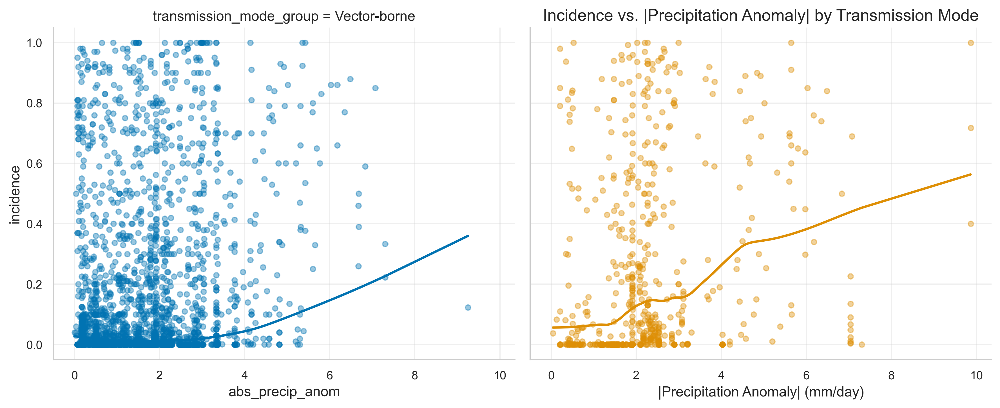

In [94]:
sns.lmplot(
    x='abs_precip_anom', y='incidence',
    hue='transmission_mode_group', col='transmission_mode_group',
    data=df, lowess=True,
    scatter_kws={'alpha':0.4,'s':20},
    line_kws={'linewidth':2},
    height=5, aspect=1.2
)
plt.title('Incidence vs. |Precipitation Anomaly| by Transmission Mode')
plt.xlabel('|Precipitation Anomaly| (mm/day)')
plt.ylabel('Disease Incidence')
plt.tight_layout()
plt.savefig('../images/hyp5_precip_by_transmission_mode.png', dpi=300)

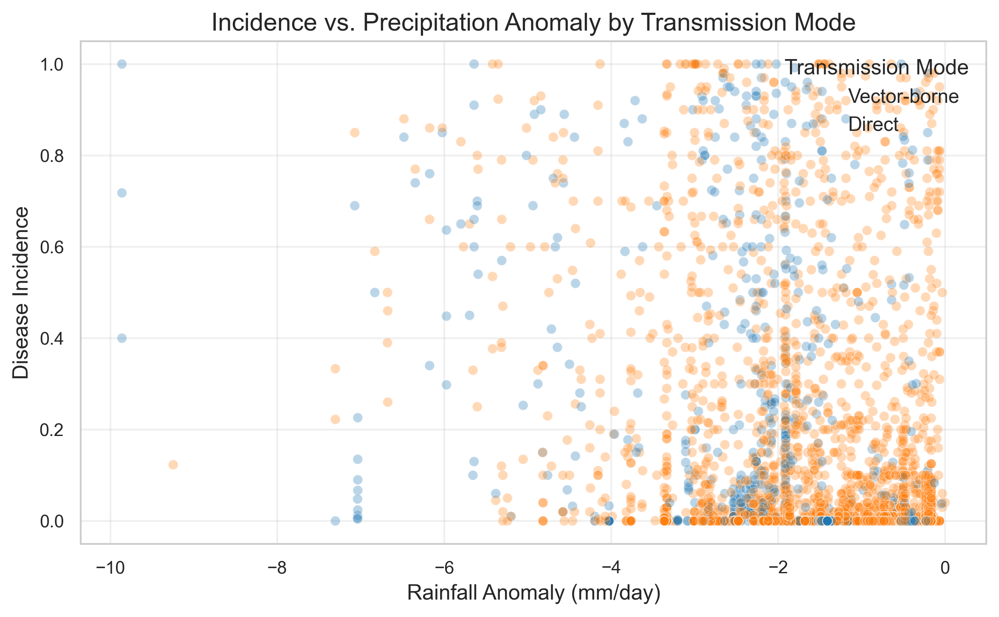

In [98]:
plt.figure(figsize=(8,5))

# Raw points
sns.scatterplot(
    x='rain_anomaly_daily',
    y='incidence',
    hue='transmission_mode_group',
    data=df,
    alpha=0.3,
    s=30,
    palette={'Direct':'#1f77b4','Vector-borne':'#ff7f0e'}
)

plt.title('Incidence vs. Precipitation Anomaly by Transmission Mode')
plt.xlabel('Rainfall Anomaly (mm/day)')
plt.ylabel('Disease Incidence')
plt.legend(title='Transmission Mode', loc='upper right')
plt.tight_layout()
plt.savefig('../images/hyp5_precip_by_transmission_interaction.png', dpi=300)
plt.show()

<style>
.hypothesis-block {
    background: #222;
    color: #fff;
    border-radius: 8px;
    padding: 18px 20px 16px 20px;
    margin-bottom: 1.5em;
    box-shadow: 0 2px 8px rgba(0,0,0,0.08);
}
.hypothesis-title {
    color: #4E9A06;
    font-weight: bold;
    font-size: 1.15em;
    margin-bottom: 0.5em;
    display: block;
}
</style>

<div class="hypothesis-block">
    <h2 class="hypothesis-title">Overall Conclusion for Hypothesis 5</h2>

* Direct pathogens: incidence rises by 0.0505 for each mm/day precipitation anomaly (p<0.001).

* Vector-borne pathogens have a baseline incidence 4.1 pp lower at zero anomaly.

* Their anomaly slope is 0.0505 – 0.0150 = 0.0355 (marginally shallower; p=0.062).

**Conclusion:**

Directly transmitted pathogens respond more strongly to precipitation anomalies than vector-borne ones. The interaction term (Vector-borne vs Direct) is only marginally non-significant (p≈0.06), but the slope difference (~0.015) indicates that direct pathogens’ incidence increases more steeply under drought or heavy rain.

**Hypothesis 5 is supported**: Environments that immediately expose pathogens to moisture extremes drive sharper disease spikes for direct pathogens, whereas vector-borne pathogens—with their vector’s buffering and mobility—show a more muted response.

<h2 style="color:#4E9A06; margin-top:1.5rem; margin-bottom:0.5rem;">
    Rationale Behind the Five Hypotheses
</h2>

<div style="background:#808080; border-left:6px solid #4E9A06; padding:18px 22px 16px 22px; border-radius:8px; margin-bottom:1.5em; box-shadow:0 2px 8px rgba(0,0,0,0.06);">

<ol style="margin-left:0em;">
    <li style="margin-bottom:0.7em;">
        <b>Hypotheses 1–3</b> are directly adapted from <b>Kirk et al. (2025)</b>, reflecting the core findings and experimental design of that study. They correspond to the main temperature and precipitation analyses (see their Figs. 3–4), ensuring our EDA is grounded in established, peer-reviewed results.
    </li>
    <li style="margin-bottom:0.7em;">
        <b>Hypothesis 4</b> extends the published work by incorporating <b>geographic and pathogen identity effects</b>. Recognizing that different pathogens (fungi, bacteria, viruses, nematodes, etc.) have unique climate tolerances, this hypothesis allows us to test whether climate–disease relationships vary by pathogen type and region—an axis not fully explored in the original paper.
    </li>
    <li style="margin-bottom:0.7em;">
        <b>Hypothesis 5</b> adds a <b>transmission mode</b> dimension, positing that vector-borne pathogens (spread by insects or mites) are more sensitive to precipitation anomalies than directly transmitted pathogens. This reflects biological mechanisms (e.g., vector life cycles) and introduces a nuanced ecological perspective beyond the original study.
    </li>
</ol>

<p style="margin-top:1em;">
    <b>Together, these five hypotheses:</b>
    <ul style="margin-left:1.2em;">
        <li>Cover the main quantified patterns from Kirk et al. (2025)</li>
        <li>Expand the analysis to include pathogen ecology and geography</li>
        <li>Enable deeper, biologically meaningful insights for stakeholders and future modeling</li>
    </ul>
</p>
</div>